## <span style="font-family:Georgia; color:rgb(172,4,8)"> **Projet 4IM01 : Images 3D et 3D+t : segmentation d'IRM du coeur** </span>

##### <span style="font-family:Georgia; color:orange">**Réalisé par:**
- <span style="font-family:Georgia;">FATNASSI Rayan</span>
- <span style="font-family:Georgia;">BEN EL GHALI Amir Loris</span>

##### <span style="font-family:Georgia; color:orange">**Encadré par:**
- <span style="font-family:Georgia;">M. LE FOLGOC Loïc</span>


<span style="font-family:Georgia; color:orange">**Année Universitaire :**</span>  <span style="font-family:Georgia;"> 2024/2025</span>

## <span style='color:green'><b> Importation des bibliothèques nécessaires 

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io as skio
from skimage.draw import disk
import torchio as tio
import cv2
from skimage.segmentation import flood
from function_util import *
from collections import deque
from skimage.color import label2rgb
import skimage.morphology as morpho
from tqdm import tqdm
import json
import random

import warnings

warnings.filterwarnings("ignore")

## <span style='color:green'>**0. Fonctions utiles à l'importation et à la manipulation des données :**

In [4]:
# Chemins pour les dossiers d'entraînement et de test
path_test = './database/testing'
path_train = './database/training'

Les fonctions ci-dessous vont créer des chemins à chacun des dossiers de patients et leurs données correspondantes :

In [5]:
# Chemin pour le dossier test du patient numéro 'i'
def path_to_test_patient(i):
    return path_test + '/patient1' + str(i).zfill(2)   # Les patients test sont numérotés de 101 à 150

# Chemin pour les données test du patient numéro 'i'
def path_to_test_patient_nii(i):
    return path_to_test_patient(i) + '/patient1' + str(i).zfill(2) + '_4d.nii.gz'  # Les dossiers data sont nommés sous le format /patientNum_4d.nii.gz (format comprimé)

# Chemin pour le dossier train du patient numéro 'i'
def path_to_train_patient(i):
    if i < 100:
        return path_train + '/patient0' + str(i).zfill(2) # Les patients train sont numérotés de 001 à 100
    else:
        return path_train + '/patient' + str(i) # Traitement du cas 100 seul

# Chemin pour les données train du patient numéro 'i'
def path_to_train_patient_nii(i):
    if i <100:
        return path_to_train_patient(i) + '/patient0' + str(i).zfill(2) + '_4d.nii.gz'
    else:
        return path_to_train_patient(i) + '/patient' + str(i) + '_4d.nii.gz'
    
# Numéros des frames de diastole et systole du patient train numéro 'i'
def systol_dystol_frame_number(i):
    # Initialize variables for x and y
    x = None
    y = None

    # Open and read the file
    with open(path_to_train_patient(i) + '/Info.cfg', 'r') as file:
        for line in file:
            if line.startswith("ED:"):
                x = int(line.split(":")[1].strip())
            elif line.startswith("ES:"):
                y = int(line.split(":")[1].strip())
    return {'dys' : x, 'sys': y}

# Numéros des frames de diastole et systole du patient test numéro 'i'
def systol_dystol_frame_number_test(i):
    # Initialize variables for x and y
    x = None
    y = None

    # Open and read the file
    with open(path_to_test_patient(i) + '/Info.cfg', 'r') as file:
        for line in file:
            if line.startswith("ED:"):
                x = int(line.split(":")[1].strip())
            elif line.startswith("ES:"):
                y = int(line.split(":")[1].strip())
    return {'dys' : x, 'sys': y}

# Chemin pour le masque de vérité terrain pour la diastole du patient train numéro 'i'
def path_to_gt_dystole_train_patient_nii(i):
    dys_num = systol_dystol_frame_number(i)['dys']
    if i <100:
        return path_to_train_patient(i) + '/patient0' + str(i).zfill(2) + '_frame' + str(dys_num).zfill(2) + '_gt.nii.gz'
    else:
        return path_to_train_patient(i) + '/patient100' + '_frame' + str(dys_num).zfill(2) + '_gt.nii.gz'

# Chemin pour le masque de vérité terrain pour la systole du patient train numéro 'i'
def path_to_gt_systole_train_patient_nii(i):
    sys_num = systol_dystol_frame_number(i)['sys']
    if i <100:
        return path_to_train_patient(i) + '/patient0' + str(i).zfill(2) + '_frame' + str(sys_num).zfill(2) + '_gt.nii.gz'
    else:
        return path_to_train_patient(i) + '/patient100' + '_frame' + str(sys_num).zfill(2) + '_gt.nii.gz'

# Chemin pour le masque de vérité terrain pour la diastole du patient test numéro 'i'
def path_to_gt_dystole_test_patient_nii(i):
    dys_num = systol_dystol_frame_number_test(i)['dys']
    return path_to_test_patient(i) + '/patient1' + str(i).zfill(2) + '_frame' + str(dys_num).zfill(2) + '_gt.nii.gz'

# Chemin pour le masque de vérité terrain pour la systole du patient train numéro 'i'
def path_to_gt_systole_test_patient_nii(i):
    sys_num = systol_dystol_frame_number_test(i)['sys']
    return path_to_test_patient(i) + '/patient1' + str(i).zfill(2) + '_frame' + str(sys_num).zfill(2) + '_gt.nii.gz'

# Fonction d'extraction de donnée pour n'importe quel path donné
def get_data_from_patient(path, diag = 'positive'):
    subject = tio.Subject(
        t1 = tio.ScalarImage(path),
        diagnosis = diag
    )

    return np.array(subject.t1.data.squeeze())

La fonction ci-dessous affiche, pour un patient `i`, les images de sa **diastole** pour toutes les coupes disponibles ainsi que leur masque de vérité terrain respectif 

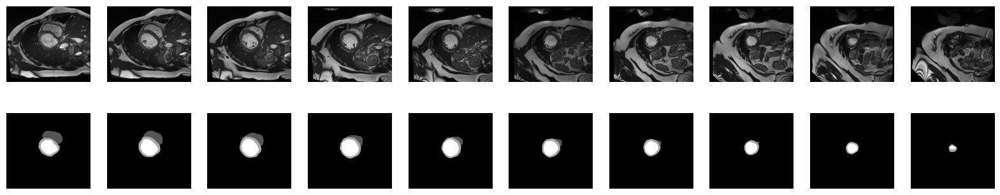

In [6]:
def affiche_data_over_slices_dystole_gt(i):

    image_data_patient1 = get_data_from_patient(path_to_train_patient_nii(i))
    image_data_dys_patient1 = get_data_from_patient(path_to_gt_dystole_train_patient_nii(i))

    nb_slices = image_data_patient1.shape[-1]

    fig, axes = plt.subplots(2, nb_slices, figsize=(20, 4))  # Adjust the figsize as needed
    axes = axes.flatten()

    dys_number = systol_dystol_frame_number(i)['dys']

    for i, ax in enumerate(axes):
        if(i < nb_slices):
            ax.imshow(image_data_patient1[dys_number,:,:,i], cmap='gray')  # Display the i-th image
            ax.axis('off')
        else : 
            ax.imshow(image_data_dys_patient1[:,:,i-nb_slices], cmap='gray')  # Display the i-th image
            ax.axis('off')
    plt.show()

affiche_data_over_slices_dystole_gt(2)

On remarque ainsi que le masque de vérité terrain contient les trois éléments : 
* Ventricule Droite (codé 1)
* Myocarde (codé 2)
* Ventricule Gauche (codé 3) 
 
Pour cette raison, lorsqu'on se refère au masque de vérité terrain pour un patient, on va mettre l'égalité `masque == 3`

In [7]:
print(get_data_from_patient(path_to_train_patient_nii(1)).shape)

(30, 216, 256, 10)


On confirme par le code ci-dessus que les dimensions des données sont sous le format : `(Nombre_de_frames, Hauteur_image, Longueur_image, Nombre_de_coupes)`.

## <span style='color:green'>**1. Détection du point initial (initial seed) pour la segmentation** 

Dans cette section, nous détectons le **point initial** pour la segmentation en utilisant l'algorithme de `détection des cercles de Hough`.  

Nous commençons par présenter les deux implémentations considérées : 
* Implémentation manuelle
* Implémentation de OpenCV.  

Pour chacune des méthodes, nous visualisons le résultat de l'algorithme avec des paramètres choisis au hasard, issus de diverses expériences.  

Enfin, pour déterminer laquelle des deux implémentations est la plus adaptée et efficace, nous les entraînons sur le jeu de données test en utilisant des listes de paramètres soigneusement sélectionnées.  

Nous définissons également une fonction <u>**coût**</u> qui permet de comparer les différentes méthodes.  

Outre les deux approches mentionnées, nous cherchons à déterminer le meilleur <u>**prétraitement**</u> des images à adopter : **la transformée de Fourier** sur l'image ou la **différence en valeur absolue** des images aux instants diastoliques et systoliques.  

Enfin, puisque le seed initial sera calculée pour une seule coupe parmi toutes les coupes et frames, nous tentons d’optimiser également le choix de cette coupe à un moment précis : la diastole. Notons que les deux approches de prétraitement précédentes éliminent la notion de temps


### <span style='color:blue'>**1.1. Implémentations de l'algorithme de Hough et visualisations :**

#### <span style='color:orange'>**1.1.1. Fonction nécessaires au pré-traitement des images :**

##### <span style='color:red'>**1.1.1.1 Fonctions nécessaires au pré-traitement pour la TF :**

La fonction ci-dessous va faire une <u>**égalisation d'histogramme**</u> pour une meilleure détection des contours.

In [8]:
def histogram_equalization(image):
    # Ces trois lignes ci-dessous vont normaliser l'histogramme de l'image afin de la normaliser et obtenir une bonne détection des edges
    image = image - image.min()  # min -> 0
    image = (image / image.max()) * 255  # max -> 255
    image = image.astype(np.uint8)  # Reconversion de l'image en valeurs sur la plage [0..255]

    # Calcul de l'histogramme de l'image
    flat_image = image.flatten()
    hist, bins = np.histogram(flat_image, bins=256, range=[0, 256], density=False)

    # Clacul de l'histogramme cumulé
    cdf = hist.cumsum()
    
    # Etirement de l'histogramme cumulé
    cdf_normalized = (cdf - cdf.min()) * 255 / (cdf.max() - cdf.min())
    cdf_normalized = cdf_normalized.astype(np.uint8) 

    # Equalisation
    equalized_image = cdf_normalized[flat_image]

    # Restauration des dimensions de l'image
    equalized_image = equalized_image.reshape(image.shape)
    
    return equalized_image

La fonction ci-dessous calcule la <u>**première harmonique de la Transformée de Fourier**</u>, contenant le maximum des variations.

In [9]:
def plot_selected_slice_fft(selected_slice, data, H1_return = False, plott = True, equalize = False):
    
    # Choix de la coupe désirée
    X = data[:,:,:,selected_slice]

    # On peut choisir si équaliser l'image ou pas, afin d'étudier l'effet de cette équalisation sur les résultats futurs.
    if equalize:
        for i in range(X.shape[0]):
            X[i] = histogram_equalization(X[i])

    # Calcul de la TF{X}
    ft_X = np.fft.fft(X, axis = 0)

    # Extraction de l'harmonique fondamentale en module
    H1 = ft_X[1,:,:]
    mag = np.abs(H1)

    # On peut choisir si visualiser l'harmonique principale ou pas, qui ne sera pas nécessaire lors des exécutions des prochaines étapes de le segmentation 
    if plott:
        plt.figure(figsize=(14,4))
        plt.title(f'Magnitude of Fourier Transform for Fundamental Harmonic of slice {selected_slice}')
        plt.imshow(mag, cmap='gray')  
        plt.colorbar(label='Magnitude')

    # On peut choisit si retourner l'harminque fondamentale ou pas
    if H1_return:
        return H1

*Un exemple de TF au patient 2 et la coupe 3 (indice 2 sur Numpy).*

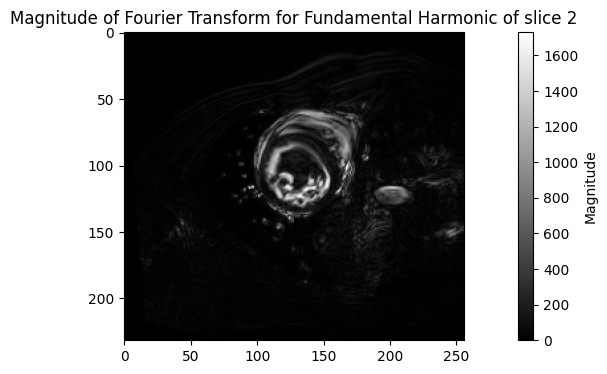

In [10]:
data = get_data_from_patient(path_to_train_patient_nii(2)) # Extraction de donées
H1_component = plot_selected_slice_fft(2, data, H1_return=True, plott=True) # Calcul de l'harmonique principale et visualisation (`plott=True`)
magnitude_h1_s = np.abs(H1_component) # Conservation de la magnitude pour l'algorithme de Hough 

In [11]:
# Sauvegarde de l'image pour l'algorithme de Hough
plt.imsave('fourier_image.jpg', np.abs(H1_component), cmap='gray')

##### <span style='color:red'>**1.1.1.2. Fonctions nécessaires au calcul de la différence absolue diastole - systole :** 

In [12]:
# Essaie de la lecture des numéros de frames pour le patient 2 
dys, sys = systol_dystol_frame_number(2).values()
print(f'diastole frame number pour le patient 2 : {dys}')
print(f'systole frame number pour le patient 2 : {sys}')

diastole frame number pour le patient 2 : 1
systole frame number pour le patient 2 : 12


La fonction ci-dessous calcule la <u>**différence en valeur absolue**</u> d'une certaine data d'un patient quelconque, à une coupe donnée et aux isntants de diastole et systole calculés en avance. 

In [13]:
def absdiff(data, slice, dys, sys):
    sliced_data = data[:,:,:,slice] # Choix de le coupe sur la quelle on calcul ce pré-traitement
    return np.abs(sliced_data[dys-1] - sliced_data[sys-1])

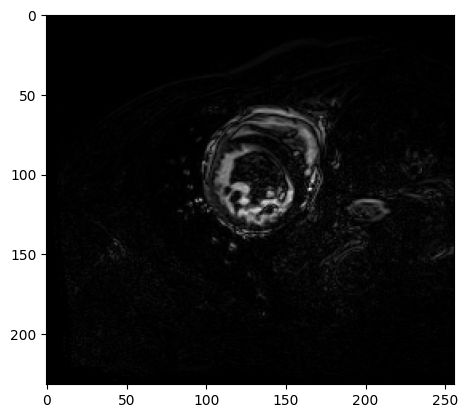

In [14]:
# Clacul et visualisation du résultat pour le patient 2, dont la data est déja importé
Abs_diff = absdiff(data, 2, dys, sys)
plt.imsave('diff_image.jpg',Abs_diff, cmap='gray') # Sauvegarde de l'image pour l'algorithme de Hough
plt.imshow(Abs_diff, cmap='gray')

On remarque qu'il y a similarité entre les deux images obtenues, mais que l'image de Fourier est <span style='color:green'>**moins bruitée**</span> parce qu'elle <u>considère moins les faibles variations</u> lorsqu'on prend l'harmonique principale seulement. 

#### <span style='color:orange'>**1.1.2. Algorithme de Hough manuellement implémenté et essaie avec des paramètres au hasard :**

Le code ci-dessous est une **impémentation manuelle** de l'algorithme de Hough par nous implémenté. On suppose qu'on a déja calculé les contours de notre image avec Canny.  

In [26]:
from collections import defaultdict

def find_hough_circles(image, image_bords, rayon_min, rayon_max, pas_rayon, nombre_angles, seuil_vote, post_process=True):

    hauteur_img, largeur_img = image_bords.shape[:2]
    
    # Pas d'angle
    pas_angle = int(360 / nombre_angles)
    
    # Liste des angles considérés de 0 à 360 avec pas dtheta
    angles = np.arange(0, 360, step=pas_angle)
    
    # Liste des rayons considérés de rayon_min à rayon_max avec pas pas_rayon 
    rayons = np.arange(rayon_min, rayon_max, step=pas_rayon)
    
    # On calcule à l'avance les cosinus et sinus pour le calcul du centre
    cos_angles = np.cos(np.deg2rad(angles))
    sin_angles = np.sin(np.deg2rad(angles))
    
    # On calcule ensuite l'espace des paramètres
    candidats_cercles = []
    for rayon in rayons:
        for indice_angle in range(nombre_angles):
            candidats_cercles.append((rayon, int(rayon * cos_angles[indice_angle]), int(rayon * sin_angles[indice_angle])))
    
    # Définition de l'accumulateur pour les votes
    accumulateur = defaultdict(int)
    
    for coord_y in range(hauteur_img):
        for coord_x in range(largeur_img):
            if image_bords[coord_y][coord_x] != 0: 
                # Si le pixel appartient à un contour, on ajoute des votes pour les centres possibles
                for rayon, rayon_cos_angle, rayon_sin_angle in candidats_cercles:
                    centre_x = coord_x - rayon_cos_angle
                    centre_y = coord_y - rayon_sin_angle
                    accumulateur[(centre_x, centre_y, rayon)] += 1 
    
    # Préparation de l'image de sortie
    image_sortie = image.copy()

    # Initialisation de la liste des cercles détectés
    cercles_detectes = []
    
    # Filtrage des cercles selon le seuil minimal
    for cercle_candidat, votes in sorted(accumulateur.items(), key=lambda i: -i[1]):
        centre_x, centre_y, rayon = cercle_candidat
        pourcentage_votes = votes / nombre_angles
        if pourcentage_votes >= seuil_vote: 
            cercles_detectes.append((centre_x, centre_y, rayon, pourcentage_votes))
    
    # Post-traitement pour fusionner les cercles voisins
    if post_process:
        seuil_pixel = 20
        cercles_post_traitement = []
        for centre_x, centre_y, rayon, votes in cercles_detectes:
            if all(abs(centre_x - centre_xc) > seuil_pixel or 
                   abs(centre_y - centre_yc) > seuil_pixel or 
                   abs(rayon - rayon_rc) > seuil_pixel 
                   for centre_xc, centre_yc, rayon_rc, _ in cercles_post_traitement):
                cercles_post_traitement.append((centre_x, centre_y, rayon, votes))
        cercles_detectes = cercles_post_traitement
    
    # Dessin des cercles détectés sur l'image originale
    for centre_x, centre_y, rayon, _ in cercles_detectes:
        image_sortie = cv2.circle(image_sortie, (centre_x, centre_y), rayon, (0, 255, 0), 1)
    return image_sortie, cercles_detectes


Voici alors l'implémentation manuelle de l'algorithme de Hough. On va donc la tester sur les deux approches de pré-traitement d'image avec des paramètres choisis de telle sorte qu'il y au moins un cercle détecté (par expériences).

On commence alors par **la valeur absolue de la différence diastole-systole**. 
On fixe :  
* Les rayons minimal et maximal à *12* et *33*
* Le pas de rayons à *1*
* Le nombre d'angles considérés à *100* (pas plus parce qu'il ralentit l'exécution)
* Le seuil des votes minimaux à *50%*
* Les seuils de détection des contours pour Canny à *50* et *100* 
 
<span style='color:red'>Note :</span> Ils existent des contours très forts **> seuil max** et des contours très faibles **< seuil min**, qui sont reliés afin de ne trouver que des composantes reliées dans notre image de contours.

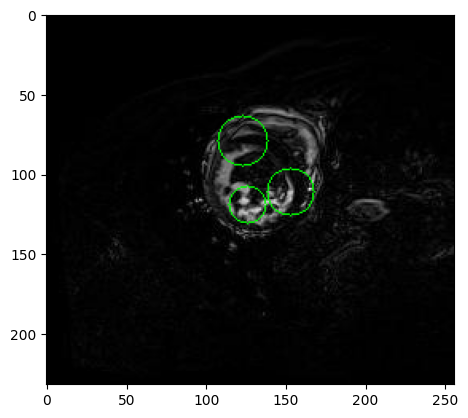

[(123, 79, 16, 0.57), (126, 119, 12, 0.54), (153, 111, 15, 0.5)]


In [27]:
img_path = 'diff_image.jpg'  # Chemin pour l'image dans cette approche

# Paramètres de Hough et Canny
r_min = 12
r_max = 33
delta_r = 1
num_thetas = 100
bin_threshold = 0.5
min_edge_threshold = 50
max_edge_threshold = 100

# Lecture de l'image
input_img = cv2.imread(img_path)

edge_image = cv2.cvtColor(input_img, cv2.COLOR_BGR2GRAY) # Conversion de l'image en format OpenCV
edge_image = cv2.Canny(edge_image, min_edge_threshold, max_edge_threshold) # Calcul de l'image contours de notre image

# Test si Canny a détecté de contours :
if edge_image is not None:
    # Calcul de l'image encerclée par les cercles détectés et des coordonnées des cercles respectifs (centres, rayons et pourcentage des votes)
    circle_img, circles = find_hough_circles(input_img, edge_image, r_min, r_max, delta_r, num_thetas, bin_threshold,post_process=1)
    plt.imshow(circle_img, cmap='gray')
    cv2.imwrite("detected_circles1.jpg", circle_img)
    plt.imsave("detected_circles1.jpg", circle_img)
    plt.show()
    print(circles)
    #cv2.waitKey(0)

Ensuite, on teste la méthode sur **l'image de Fourier** avec les mêmes paramètres : 

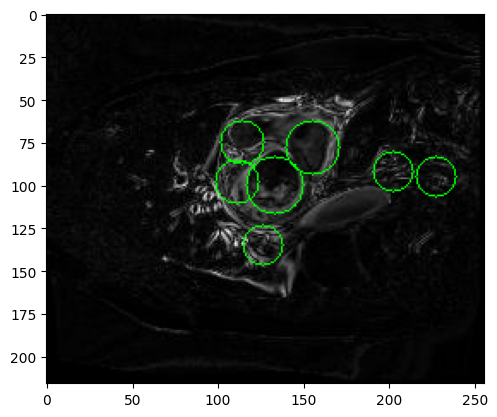

[(114, 75, 13, 0.64), (133, 100, 17, 0.58), (126, 135, 12, 0.58), (155, 78, 16, 0.55), (202, 92, 12, 0.55), (227, 95, 12, 0.55), (111, 98, 13, 0.55)]


In [28]:
img_path = 'fourier_image.jpg'  # Chemin pour l'image de Fourier

# Paramètres de Hough et Canny
r_min = 12
r_max = 33
delta_r = 1
num_thetas = 100
bin_threshold = 0.55
min_edge_threshold = 50
max_edge_threshold = 100

# Lecture de l'image
input_img = cv2.imread(img_path)

edge_image = cv2.cvtColor(input_img, cv2.COLOR_BGR2GRAY) # Conversion de l'image en format OpenCV
edge_image = cv2.Canny(edge_image, min_edge_threshold, max_edge_threshold) # Calcule des contours de l'image

if edge_image is not None:
    circle_img, circles = find_hough_circles(input_img, edge_image, r_min, r_max, delta_r, num_thetas, bin_threshold,post_process=1)
    plt.imshow(circle_img, cmap='gray')
    cv2.imwrite("detected_circles2.jpg", circle_img)
    plt.imsave("detected_circles2.jpg", circle_img)
    plt.show()
    #cv2.waitKey(0)
    print(circles)


On remarque tout d'abord que pour les paramètres considérés, <u>plusieurs cercles on été détectés</u>. Toutes les deux méthodes one donné <span style='color:green'>**le premier cercle (celui qui possède le plus de votes) avec son centre à l'intérieur du ventricule gauche**</span>. Cela donne un succès de ces méthodes, vu qu'on va **toujours retenir seulement le premier cercle**. 

Par contre, on remarque aussi que le rayon du premier cercle de l'image de Fourier <u>approxime mieux</u> le rayon du ventricule gauche que l'autre approche. Cela pourrait signifier que l'image de Fourier peut donner des meilleurs résutlat que celle de la différence absolue. Mais, on va vérifier si ça est vrai avec un entraînement de cette méthode aux deux approches plus tard.

#### <span style='color:orange'>**1.1.3. Algorithme de Hough implémenté par OpenCV et essaie avec des paramètres au hasard :**

Maintenant, on va considérer l'implémentation de l'algorithme de Hough avec <span style='color:blue'>**OpenCV**</span>. Pour cela, on utilise directement la fonction `HoughCircles` qui prend en paramètre : 
* L'image en niveaux de gris
* La méthode de recherche des pixels à considérer dans l'image (on utilise le gradient pour des raisons de rapidité)
* Le pas de rayon
* Le rayon maximale à ne pas dépasser (taille de l'image / 2)
* Un paramètre param1 de seuil de contours détectés par Canny
* Un paramètre param2 de seuil de votes pour l'accumlateur
* Un rayon minimal et rayon maximal. 

<span style='color:red'>Note :</span> Il est à noter que la fonction `HoughCircles` possède déja une détection de contours implémenté à l'intérieur qui est optimisé selon l'input image.

In [29]:
def hough_circles(path, show_circles = False, par1 = 160, par2 = 33):
    # Lectur de l'image
    input_img = cv2.imread(path)
    
    # Conversion au format OpenCV
    gray_input_image = cv2.cvtColor(input_img, cv2.COLOR_BGR2GRAY)
    
    # Calcul des cercles par Hough de OpenCV
    circles = cv2.HoughCircles(gray_input_image, cv2.HOUGH_GRADIENT, 1, input_img.shape[0] / 2, param1 = par1, param2 = par2, minRadius=5, maxRadius=30)
    
    # Conversion des coordonnées des cercles donnés par Hough en entier, vu qu'il utilise des réels comme des centres et rayons
    if circles is not None:
        circles = np.uint16(np.around(circles))

        for i in circles[0, :]:
            # Dessin des cercles sur l'image d'origine
            cv2.circle(input_img ,(i[0], i[1]), i[2], (0, 0, 255), 1)
    else:
        return None

    plt.imsave('cv2_trial.jpg', input_img)
    if show_circles:
        # Visualisation de l'image encerclée si l'on désire
        plt.imshow(input_img, cmap='gray')
        plt.show()

    return circles


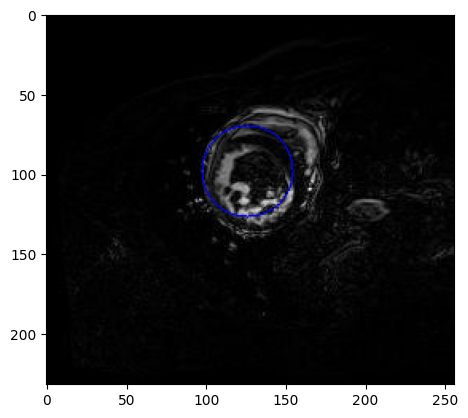

array([[[126,  98,  29]]], dtype=uint16)

In [30]:
# Test sur l'image de la différence absolue
hough_circles('diff_image.jpg', show_circles = True)

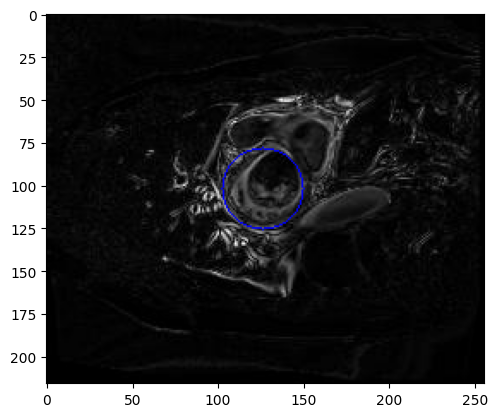

array([[[126, 102,  24]]], dtype=uint16)

In [31]:
# Test sur l'image de Fourier
hough_circles('fourier_image.jpg', show_circles = True)

On remarque bien que les deux résultats sont <span style='color:green'>assez satisfaisants</span>. Enfaite, **un seul cercle a été détecté qui est celui qui encercle le ventricule gauche**.

De plus, il est à noter que la méthode de Hough manuellement implémentée demande <u>**15 secondes**</u> en moyenne pour la détection des cercles, alors que celle implémentées par OpenCV <u>**ne surpasse pas la seconde**</u>. Cela est expliqé par le faite que OpenCV <span style='color:green'>**optimise le parcours des pixels**</span> de l'image par une suivi des gradients de l'image qui convergent vers les centres des cercles de l'image. 

Cette différence dans la complexité temporelle va nous empêcher d'entraîner au mieux les deux méthodes de façon équivalente. Pour cette raison, on a <u>bien choisit les listes des paramètres à considérer pour la méthode manuelle</u> de telle façon que les paramètres optimaux soient contenus au centre (choix basé sur nombreuses expériences).

### <span style='color:blue'>**1.2. Entraînement de l'algorithme de Hough, optimisation des paramètres et tests :** 

Pour l'implémentation manuelle de Hough, on a décidé de <u>fixer quelques paramètres afin d'accélèrer l'exécution</u>. 

On a fixé : 
* Le rayon minimale à `12` pixels
* Le pas de rayons à `1` pixel par itération
* Le nombre d'angles à `100`. 
 
On a donc décidé de varier les paramètres : <u>rayon maximal</u>, <u>seuil pour les votes</u> et les <u>seuils minimal et maximal de Canny</u>.

La fonction ci-dessous va calculer les **cercles de Hough pour des paramètres fixés**.

In [32]:
def manual_hough_algorithm(img_path, r_max, bin_threshold, min_edge_threshold, max_edge_threshold):
    # Paramètres fixes pour toutes les itérations
    r_min = 12
    delta_r = 1
    num_thetas = 100

    # Lecture de l'image
    input_img = cv2.imread(img_path)

    edge_image = cv2.cvtColor(input_img, cv2.COLOR_BGR2GRAY) # Conversion de l'image en format OpenCV
    edge_image = cv2.Canny(edge_image, min_edge_threshold, max_edge_threshold) # Calcul de l'image des edges
    
    if edge_image is not None:
        _, circles = find_hough_circles(input_img, edge_image, r_min, r_max, delta_r, num_thetas, bin_threshold,post_process=1) # Calcul des cercles de Hough (manuelle)
        return circles
    return None

#### <span style='color:orange'><b>1.2.1. Optimisation des paramètres de l'algorithme de Hough implémenté manuellement sur l'harmonique principale:

La fonction ci-dessous va évaluer la **Transformée de Hough manuelle sur les images de Fourier**. 

In [33]:
def detect_initial_seed_fourier_manual(patient, r_max, bin_threshold, min_edge_threshold, max_edge_threshold, equalize):
    # Calcul de l'harmonique fondamentale de Fourier
    patient_data = get_data_from_patient(path_to_train_patient_nii(patient))
    H1 = plot_selected_slice_fft(1, patient_data, H1_return=1, plott = False, equalize = equalize)
    H1_magnitude = np.abs(H1)
    
    # Sauvegarde de l'image pour la relecture en OpenCV
    plt.imsave('fourier_image.jpg', H1_magnitude, cmap='gray')
    img_path = 'fourier_image.jpg'

    # Evaluation des cercles de Hough (manuelle)
    circles = manual_hough_algorithm(img_path, r_max, bin_threshold, min_edge_threshold, max_edge_threshold)

    # Si on a des cercles détectés, on va retourner le premier cercle qui est celui qui possède le plus de votes. Sinon il va retourner un entier.
    if circles is not None:
        if len(circles) != 0:
            circles = np.uint16(np.around(circles))
            return [circles[0][0], circles[0][1]]
    return 1

La fonction ci-dessous est notre <span style='color:blue'>**fonction coût**</span> : elle extrait le <u>masque vérité terrain</u> de notre patient à l'instant de la diastole et pour la coupe pré-chosie, et il évalue <u>**si le centre détecté par Hough est à l'intérieur du ventricule guache ou pas**</u>.

In [34]:
def center_within_gt_mask(patient, selected_slice, seed):
    # Extraction du masque vérité terrain pour la diastole, et à la coupe donnée
    gt_mask = get_data_from_patient(path_to_gt_dystole_train_patient_nii(patient))[:,:,selected_slice]
    # Test d'appartenance du centre au ventricule gauche, dont le code est 3 
    return gt_mask[seed[1], seed[0]] == 3

Enfin, avec le `modèle` et la `fonction coût` prêtes, nous pouvons **entraîner** notre modèle sur le jeu de données d'entraînement. Pour ce faire, nous avons :
1. Créé un **fichier** vide destiné à stocker les paramètres optimaux chaque fois que le coût diminue.  
2. Définition d'un **dictionnaire de paramètres** pour les variables de notre modèle, ainsi qu’un paramètre d'égalisation d'histogramme qui peut être activé ou désactivé (vrai ou faux). 
3. **Parcours de l'ensemble des paramètres** et **évaluation de notre algorithme de Hough** en fonction des paramètres locaux de la boucle et pour chaque patient.  
4. Vérification après obtention du centre de Hough, **si ce centre se trouve effectivement à l'intérieur du ventricule gauche**. Si tel est le cas, nous incrémentons notre résultat de 1. 
5. Si, après avoir traité tous les patients, le résultat **dépasse** celui précédemment obtenu, nous enregistrons les paramètres locaux ainsi que le résultat courant dans le fichier que nous avons construit au début.  

À la fin de l'exécution de la boucle, nous affichons les résultats finaux, sachant qu'ils ont été **sauvegardés dans le fichier pour éviter de réexécuter l'algorithme**.  


In [35]:
def optimal_params_dict_fourier_manual(liste_rmax, liste_bin_thre, liste_min_edge, liste_max_edge):
    # Création fichier des paramètres et résultats locaux et final
    with open('Fourier_best_params_manual.txt', 'w') as file:
        file.write('Fourier starting : \n')
    # Initialisation du compteur optimal et du dictionnaire de paramètres optimaux
    compteur_optimal = 0
    param_optimal = {
        'rmax': None,
        'bin_threshold': None,
        'min_edge_threshold': None,
        'max_edge_threshold': None,
        'equalization': None
    }

    # Afin de réduire le temps de calcul de cette optimisation, qui devrait durer 14 heures pour 100 patients, 
    # on choisit au hasard 50 patients parmi les 100 qu'on possède.
    liste_patients = random.sample(range(1, 101), 50)
    # Calcul du nombre des iitérations en dehors des fonction pour une visualisation du temps restant
    total_iter = len(liste_rmax) * len(liste_bin_thre) * len(liste_min_edge) * len(liste_max_edge) * len(liste_patients)

    # Boucle sur toutes les combinaisons de paramètres
    with tqdm(total=total_iter, desc="Progression globale") as pbar:
        for eq in [True]:
            for rmax in liste_rmax:                     # liste des possibilités pour rayon max
                for bin_thre in liste_bin_thre:         # liste des possibilités pour seuil de vote
                    for min_edge in liste_min_edge:     # liste des possibilités pour seuil minimal de Canny
                        for max_edge in liste_max_edge: # liste des possibilités pour seuil maximal de Canny
                            compteur = 0                # Initialisation du compteur pour cette combinaison

                            # Boucle sur chaque patient
                            for patient in liste_patients:
                                # Exécution de la fonction "detect_initial_seed_fourier_manual"
                                initial_seed = detect_initial_seed_fourier_manual(patient, rmax, bin_thre, min_edge, max_edge, eq)
                                
                                # Test sur le seed, qui doit être une liste de 2 éléments et pas un entier pour évaluer si un centre a été détecté
                                if type(initial_seed) is int:
                                    resultat = False
                                else:
                                    # résultat = Vrai que si le centre est à l'intérieur du ventricule gauche 
                                    resultat = center_within_gt_mask(patient, 1, initial_seed)

                                # Si le résultat = Vrai, incrémentation du compteur indiquant que le patient a eu succès dans la détection de centre
                                if resultat:  
                                    compteur += 1
                                    
                                # Incrémentation de la grille d'exécution
                                pbar.update(1)

                            # Vérification si le compteur actuel est meilleur que le compteur optimal
                            if compteur >= compteur_optimal:
                                compteur_optimal = compteur
                                param_optimal['rmax'] = rmax
                                param_optimal['bin_threshold'] = bin_thre
                                param_optimal['min_edge_threshold'] = min_edge
                                param_optimal['max_edge_threshold'] = max_edge
                                param_optimal['equalization'] = eq


                                # Sauvegarde des paramètres optimaux locaux et du compteur optimal local dans le fichier
                                with open('Fourier_best_params_manual.txt', 'a') as file:
                                    file.write('\n')
                                    json.dump(param_optimal, file, indent=4)  
                                    file.write(f'\n last best optimal counter {compteur_optimal}')
    # Affichage du résultat
    print(compteur_optimal)
    print(param_optimal)

    return (param_optimal, compteur_optimal)

La cellule ci-dessous nous donne une idée sur combien de temps l'algirithme de détection des centres a pris pour optimiser les paramètres. On note bien qu'il a mis environs 8 heures même si on n'a pris que la moitié du nombre des patients.

On remarque que l'algorithme, pour les paramètres optimaux, n'a détecté que 23 patients parmi 50. Pour plus de précision, on va relancer la fonction sur **tous les patients de train** pour avoir une idée sur le résultat total. 

In [ ]:
#Manual_fourier_best_params, manual_fourier_best_cpt = optimal_params_dict_fourier_manual(liste_rmax=[30, 32, 34], liste_bin_thre=[0.55, 0.6, 0.65], liste_min_edge=[50, 60, 70], liste_max_edge=[100, 120])

[99, 52, 92, 21, 89, 73, 9, 5, 31, 7, 33, 81, 97, 24, 55, 63, 87, 98, 54, 56, 25, 76, 59, 46, 37, 74, 96, 36, 65, 79, 4, 44, 19, 47, 1, 26, 82, 29, 77, 30, 64, 60, 83, 75, 6, 58, 53, 38, 50, 90]


Progression globale: 100%|██████████| 2700/2700 [8:06:22<00:00, 10.81s/it]  

23
{'rmax': 34, 'bin_threshold': 0.55, 'min_edge_threshold': 70, 'max_edge_threshold': 120, 'equalization': True}


#### <span style='color:orange'><b>1.2.2. Test des paramètres optimaux de l'algorithme de Hough implémenté manuellement sur l'harmonique principale:

La fonction ci-dessous **extrait le dernier dictionnaire dans notre fichier ainsi que le dernier compteur**, qui correspondent <u>au dictionnaire et compteurs optimaux</u> pour les données de train.

In [36]:
def get_last_dictionary_and_counter(file_path):
    last_dict = None
    last_counter = None
    current_dict_lines = []

    with open(file_path, 'r') as file:
        lines = file.readlines()

        for line in lines:
            # Test sur les lignes qui peuvent être des dictionnaires
            if line.strip().startswith('{'): # Début de dictionnaire
                current_dict_lines = [line]  # Ajout de l'accolade d'ouverture 
            elif line.strip().startswith('}'): # Fin de dictionnaire
                current_dict_lines.append(line) # Ajout de l'accolade de fermeture
                try:
                    # Essai de composition de dictionnaire avec les lignes qui ont était rassemblées 
                    parsed_dict = json.loads(''.join(current_dict_lines))
                    if isinstance(parsed_dict, dict):
                        last_dict = parsed_dict  # Sauvegarde du dernier dictionnaire trouvé
                except json.JSONDecodeError:
                    pass
                current_dict_lines = []  # Fin de dictionnaire -> reset des lignes considérées
            elif current_dict_lines:
                current_dict_lines.append(line)  # Accumulation des lignes appartenantes à un dictionnaire

            # Test sur la ligne qui doit contenir le compteur optimal
            if "last best optimal counter" in line:
                last_counter = line.split()[-1]  # Extraction de sa valeur

    return last_dict, last_counter

Suite à l'implémentation de la fonction ci-dessus, on peut extraire notre dictionnaire de paramètres optimaux présent dans le fichier `Fourier_best_params_manual`

In [37]:
Manual_fourier_best_params, manual_fourier_best_cpt = get_last_dictionary_and_counter('Fourier_best_params_manual.txt')

In [38]:
# Extraction des paramètres optimaux présents dans le dictionnaire
rmax, bin_thre, min_edge, max_edge, eq = Manual_fourier_best_params.values()

Le code ci-dessous va <u>**tester**</u> notre implémentation manuelle de Hough avec les paramètres optimaux sur **toutess les données de train**. 

In [39]:
# Initialisation compteur
compteur = 0

for patient in range(1,101):
    # Exécution de la fonction "detect_initial_seed_fourier_manual"
    initial_seed = detect_initial_seed_fourier_manual(patient, rmax, bin_thre, min_edge, max_edge, eq)
    
    # Test sur le centre détecté
    if type(initial_seed) is int:
        resultat = False
    else:
        resultat = center_within_gt_mask(patient, 1, initial_seed)

    # Incrémentation du compteur suite à une bonne détection
    if resultat:  
        compteur += 1

print(f"Pour l'implémentation manuelle de Hough sur Fourier, le nombre de patients dont le centre a été bien détecté est : {compteur}")

Pour l'implémentation manuelle de Hough sur Fourier, le nombre de patients dont le centre a été bien détecté est : 48


Notre implémentation manuelle a détecté *48* patient parmi *100*. Ce résultat est assez bas, mais qui va <span style='color:green'><b>améliorer</span></b> avec l'autre implémentation. 

#### <span style='color:orange'><b>1.2.3. Test de l'algorithme de Hough implémenté manuellement sur l'harmonique principale sur le jeu de données Test:

La fonction ci-dessous est une **réplique** de celle définie avant. On va juste <u>**changer le chemin d'accès au données pour extraire les données de test cette foix.**</u>

In [40]:
def detect_initial_seed_fourier_manual_test(patient, r_max, bin_threshold, min_edge_threshold, max_edge_threshold, equalize):
    # Extraction des données de test. 
    patient_data = get_data_from_patient(path_to_test_patient_nii(patient))
    H1 = plot_selected_slice_fft(1, patient_data, H1_return=1, plott = False, equalize = equalize)
    H1_magnitude = np.abs(H1)
    
    plt.imsave('fourier_image.jpg', H1_magnitude, cmap='gray')
    img_path = 'fourier_image.jpg'

    circles = manual_hough_algorithm(img_path, r_max, bin_threshold, min_edge_threshold, max_edge_threshold)

    if circles is not None:
        if len(circles) != 0:
            circles = np.uint16(np.around(circles))
            return [circles[0][0], circles[0][1]]
    return 1

Ici on doit **réimplémenter** la fonction coût pour quelle <u>**s'exécute sur les masques de vériré terrain de la diastole des patients de test**</u> et non plus du train. 

In [41]:
def center_within_gt_mask_test(patient, selected_slice, seed):
    # Extraction du masque vérité terrain pour la diastole, et à la coupe donnée pour le jeu de donnée test
    gt_mask = get_data_from_patient(path_to_gt_dystole_test_patient_nii(patient))[:,:,selected_slice]
    # Test d'appartenance du centre au ventricule gauche, dont le code est 3 
    return gt_mask[seed[1], seed[0]] == 3

In [42]:
# Evaluation de l'implémentation sur le jeu de donnée test : 
compteur = 0
for patient in range(1,51):
    # Exécution de la fonction "detect_initial_seed_fourier_manual_test"
    initial_seed = detect_initial_seed_fourier_manual_test(patient, rmax, bin_thre, min_edge, max_edge, eq)
    
    if type(initial_seed) is int:
        resultat = False
    else:
        resultat = center_within_gt_mask(patient, 1, initial_seed)

    if resultat:  
        compteur += 1

print(f"Pour l'implémentation manuelle de Hough sur Fourier, le nombre de patients de test dont le centre a été bien détecté est : {compteur}")

Pour l'implémentation manuelle de Hough sur Fourier, le nombre de patients de test dont le centre a été bien détecté est : 8


#### <span style='color:orange'><b>1.2.4. Test de l'algorithme de Hough implémenté manuellement sur la diffèrence absolue diastole-systole sur le jeu de données de test :

Vu que l'entraînement des meilleurs paramètres de Hough sur les patients prend <span style='color:red'>énormément de temps de calcul</span>, on a décidé d'utiliser les **mêmes paramètres de Hough sur Fourier**. Les fonctions sont très similaires à celles précedentes, on a donc réimplémenté une fonction qui utilise l'image de la différence absolue comme entrée de l'algorithme de Hough.

In [43]:
# Implémentation de l'algortihme de Hough sur l'image de la différence absolu diastole - systole pour les données de Train
def detect_initial_seed_diff_manual(patient, r_max, bin_threshold, min_edge_threshold, max_edge_threshold, equalize):
    
    patient_data = get_data_from_patient(path_to_train_patient_nii(patient))
    # Calcul de la différence absolue diastole-systole
    dys, sys = systol_dystol_frame_number(patient).values()
    Abs_diff = np.abs(patient_data[dys-1,:,:,1] - patient_data[sys-1,:,:,1])
    
    plt.imsave('diff_image.jpg', Abs_diff, cmap='gray')
    img_path = 'diff_image.jpg'

    circles = manual_hough_algorithm(img_path, r_max, bin_threshold, min_edge_threshold, max_edge_threshold)

    if circles is not None:
        if len(circles) != 0:
            circles = np.uint16(np.around(circles))
            return [circles[0][0], circles[0][1]]
    return 1

In [44]:
compteur = 0
for patient in range(1,51):
    # Exécution de la fonction "detect_initial_sheet"
    initial_seed = detect_initial_seed_diff_manual(patient, rmax, bin_thre, min_edge, max_edge, eq)
    
    # Testing on the seed
    if type(initial_seed) is int:
        resultat = False
    else:
        resultat = center_within_gt_mask(patient, 1, initial_seed)

    # Supposons que "resultat" soit un booléen indiquant si le test est réussi
    if resultat:  
        compteur += 1

print(f"Pour l'implémentation manuelle de Hough sur la différence absolue, le nombre de patients de train dont le centre a été bien détecté est : {compteur}")

Pour l'implémentation manuelle de Hough sur la différence absolue, le nombre de patients de train dont le centre a été bien détecté est : 25


In [45]:
# Implémentation de l'algortihme de Hough sur l'image de la différence absolu diastole - systole pour les données de Test
def detect_initial_seed_diff_manual_test(patient, r_max, bin_threshold, min_edge_threshold, max_edge_threshold, equalize):
    
    patient_data = get_data_from_patient(path_to_test_patient_nii(patient))
    dys, sys = systol_dystol_frame_number_test(patient).values()
    Abs_diff = np.abs(patient_data[dys-1,:,:,1] - patient_data[sys-1,:,:,1])
    
    plt.imsave('diff_image.jpg', Abs_diff, cmap='gray')
    img_path = 'diff_image.jpg'

    circles = manual_hough_algorithm(img_path, r_max, bin_threshold, min_edge_threshold, max_edge_threshold)

    if circles is not None:
        if len(circles) != 0:
            circles = np.uint16(np.around(circles))
            return [circles[0][0], circles[0][1]]
    return 1

In [46]:
compteur = 0
for patient in range(1,51):
    # Exécution de la fonction "detect_initial_sheet"
    initial_seed = detect_initial_seed_diff_manual_test(patient, rmax, bin_thre, min_edge, max_edge, eq)
    
    # Testing on the seed
    if type(initial_seed) is int:
        resultat = False
    else:
        resultat = center_within_gt_mask(patient, 1, initial_seed)

    # Supposons que "resultat" soit un booléen indiquant si le test est réussi
    if resultat:  
        compteur += 1

print(f"Pour l'implémentation manuelle de Hough sur la différence absolue, le nombre de patients de test dont le centre a été bien détecté est : {compteur}")

Pour l'implémentation manuelle de Hough sur la différence absolue, le nombre de patients de test dont le centre a été bien détecté est : 11


#### <span style='color:orange'><b>1.2.5. Optimisation des paramètres de Hough implémenté sur OpenCV :

Dans cette étape, on désire savoir <u>**quels sont les <span style='color:green'>paramètres optimaux</span> pour la méthode de Hough implémentée par <span style='color:blue'>OpenCV</span>**</u>. Pour cela, on construit comme avnant les fonctions atomiques qui calculent les cercles de Hough pour des paramètres localement fixés et d'autres globalement fixés (notament `les rayons minimal` et `maximal` des cercles). 

##### <span style='color:red'><b>1.2.5.1. Optimisation des paramètres de Hough implémenté sur OpenCV sur l'image de Fourier:

In [47]:
# Fonction qui calcule les cercles de Hough pour des paramètres par1 et par2 fixés
def hough_circles_opt(path, par1 = 160, par2 = 33):
    # Lecture de l'image
    input_img = cv2.imread(path)
    # Conversion de l'image en format OpenCV
    gray_input_image = cv2.cvtColor(input_img, cv2.COLOR_BGR2GRAY)
    # Détection des cercles par la fonction 'HoughCircles'
    circles = cv2.HoughCircles(gray_input_image, cv2.HOUGH_GRADIENT, 1, input_img.shape[0] // 2, param1 = par1, param2 = par2, minRadius=5, maxRadius=30)
    return circles

In [48]:
# Fonction qui définie l'image d'entrée pour la fonction précédente et retourne le cercle avec plus de votes (cercle à l'indice 0)
def detect_initial_seed_fourier(patient, selected_slice, par1 = 160, par2 = 33, equalize = False):
    # Importation données
    patient_data = get_data_from_patient(path_to_train_patient_nii(patient))
    # Calcul de l'harmonique fondamentale 
    H1 = plot_selected_slice_fft(selected_slice, patient_data, H1_return=1, plott = False, equalize = equalize)
    H1_magnitude = np.abs(H1)
    # Savegarde de l'image pour la conversion
    plt.imsave('fourier_image.jpg', H1_magnitude, cmap='gray')
    img_path = 'fourier_image.jpg'

    # Calcul des cercles 
    circles = hough_circles_opt(img_path, par1=par1, par2=par2)

    if circles is not None:
        circles = np.uint16(np.around(circles))
        return circles[0][0][:-1]
    return 1

Ayant notre **modèle** prêt et la **fonction coût** déjà définie avant, on peut alors entraîner le modèle sur les données de train. 

Comme l'entraînement précédent : 
* On crée un fichier pour enregistrer les compteurs et paramètres optimaux locaux
* On itère sur toutes les combinaisons possibles de variables dans les listes des varaiables choisies
* On évalue les cercles de Hough
* On teste si les centres des cecrles sont à l'intérieur du ventricule gauche 
* On enregistre les paramètres si on observe une augmentation du nombre des centres bien détectés. 

In [49]:
def optimal_params_dict_fourier(liste_param1, liste_param2, liste_slices = [1,2,3,4,5,6]):
    # Création du fichier des paramètres optimaux 
    with open('Fourier_best_params.txt', 'w') as file:
        file.write('Fourier starting : \n')
    # Initialisation du compteur optimal et du dictionnaire de paramètres optimaux
    compteur_optimal = 0
    param_optimal = {
        'param1': None,
        'param2': None,
        'slice': None,
        'equalization': None
    }

    # Calcul du nombre d'itérations pour la barre de progression
    total_iter = len(liste_param1) * len(liste_param2) * len(liste_slices) * 100 * 2

    # Boucle sur toutes les combinaisons de paramètres
    with tqdm(total=total_iter, desc="Progression globale") as pbar:
        for eq in [True, False]:                   # liste des possibilités pour eq (avec ou sans)
            for param1 in liste_param1:            # liste des possibilités pour param1
                for param2 in liste_param2:        # liste des possibilités pour param2
                    for slice_ in liste_slices:    # liste des possibilités pour slice
                        compteur = 0               # Initialisation du compteur pour cette combinaison

                        # Boucle sur chaque patient
                        for patient in range(1, 101):
                            # Exécution de la fonction "detect_initial_sheet"
                            initial_seed = detect_initial_seed_fourier(patient, slice_, param1, param2, eq)
                            
                            # Test si il y a un centre détecté
                            if type(initial_seed) is int:
                                resultat = False
                            else:
                                resultat = center_within_gt_mask(patient, slice_, initial_seed)

                            # Si résultat = Vrai -> incrémentation du compteur (centre bien détecté)
                            if resultat:  
                                compteur += 1
                            
                                
                            # Mise à jour de la barre de progression
                            pbar.update(1)

                        # Vérification si le compteur actuel est meilleur que le compteur optimal
                        if compteur >= compteur_optimal:
                            compteur_optimal = compteur
                            param_optimal['param1'] = param1
                            param_optimal['param2'] = param2
                            param_optimal['slice'] = slice_
                            param_optimal['equalization'] = eq


                            # Enregistrement des paramètres optimaux locaux
                            with open('Fourier_best_params.txt', 'a') as file:
                                file.write('\n')
                                json.dump(param_optimal, file, indent=4)  # The indent makes it more readable
                                file.write(f'\n last best optimal counter {compteur_optimal}')
                        
    

    return (param_optimal, compteur_optimal)

Une fois la fonction d'entraînement implémentée, on l'exécute sur l'image de Fourier et une **liste de paramètres bien choisie**, mais plus <b><span style='color:green'>vaste</span></b> que la méthode précedente parce que cette méthode est <u>**nettement plus rapide que celle manuelle**</u>. 

Pour cela, on a pris : 
* 7 valeurs pour param1 
* 6 valeurs pour param2 
* Les coupes allant de l'indice 0 à 6 (vu que le patient qui possède le moins de coupes en possède 6) 

Ensuite, on retire comme d'habitude les paramètres optimaux et le compteur optimal enrégistrés dans le fichier. 

In [ ]:
#Fourier_best_params, fourier_best_cpt = optimal_params_dict_fourier(liste_param1=list(range(150, 211, 10)), liste_param2=list(range(30, 40, 2)), liste_slices=np.arange(0,7))

Progression globale:  65%|██████▍   | 45222/70000 [16:17:22<5:39:27,  1.22it/s] 

Suite à cette exécution, on va entraîner directement la **même implémentation** mais sur l'image de la **différence absolue diastole - systole** pour comparer directement les résultats des deux méthodes.

##### <span style='color:red'><b>1.2.5.2. Optimisation des paramètres de Hough implémenté sur OpenCV sur l'image de la différence absolue diastole - systole:

In [50]:
# Fonction pour le calcul des cercles initiaux avec la différence absolue diastole - systole 
def detect_initial_seed_difference(patient, selected_slice, par1 = 160, par2 = 33):
    # Extraction donées
    patient_data = get_data_from_patient(path_to_train_patient_nii(patient))
    # Calcul de l'image de la différence absolue diastole - systole
    dys = systol_dystol_frame_number(patient)['dys']
    sys = systol_dystol_frame_number(patient)['sys']
    plt.imsave('diff_image.jpg',absdiff(patient_data, selected_slice, dys = dys-1, sys = sys-1), cmap='gray')
    img_path = 'diff_image.jpg'

    # Evaluation des cercles de Hough
    circles = hough_circles_opt(img_path, par1=par1, par2=par2)

    # Retour du centre du premier cercle, s'il existe
    if circles is not None:
        circles = np.uint16(np.around(circles))
        return circles[0][0][:-1]
    return 1    

Ensuite, on **réécris la fonction d'entraînement**, seulement en <u>changeant le nom de fichier</u>. 

On a aussi constaté selon les entraînements et les résultats précédents <span style='color:green'>qu'une égalisation d'histogramme est un pré-traitement qui donne toujours des meilleurs résultats pour chaque étape</span>. Donc, afin d'optimiser le temps d'exécution de cet entraînement, on a éliminé la liste d'égalisation qui est vrai ou faux, et on l'**a maintenu vrai**. 

In [51]:
def optimal_params_dict_difference(liste_param1, liste_param2, liste_slices = [1,2,3,4,5,6]):
    # Création d'un nouveau fichier vide
    with open('Difference_best_params.txt', 'w') as file:
        file.write('Difference starting : \n')
    # Initialisation du compteur optimal et du dictionnaire de paramètres optimaux
    compteur_optimal = 0
    param_optimal = {
        'param1': None,
        'param2': None,
        'slice': None
    }
    
    # Calcul du nombre d'itérations pour la barre de progression
    total_iter = len(liste_param1) * len(liste_param2) * len(liste_slices) * 100 * 2

    # Boucle sur toutes les combinaisons de paramètres
    with tqdm(total=total_iter, desc="Progression globale") as pbar:
        for param1 in liste_param1:            # liste des possibilités pour param1
            for param2 in liste_param2:        # liste des possibilités pour param2
                for slice_ in liste_slices:    # liste des possibilités pour slice
                    compteur = 0               # Initialisation du compteur pour cette combinaison

                    # Boucle sur chaque patient
                    for patient in range(1, 101):
                        # Exécution de la fonction "detect_initial_seed_difference"
                        initial_seed = detect_initial_seed_difference(patient, slice_, param1, param2)
                        
                        # Test si le centre est à l'intérieur du ventricule gauche
                        if type(initial_seed) is int:
                            resultat = False
                        else:
                            resultat = center_within_gt_mask(patient, slice_, initial_seed)

                        # Incrémentation du compteur lorsqu'on a bonne détection de centre
                        if resultat:  
                            compteur += 1
                            
                        pbar.update(1)

                    # Vérification si le compteur actuel est meilleur que le compteur optimal
                    if compteur >= compteur_optimal:
                        compteur_optimal = compteur
                        param_optimal['param1'] = param1
                        param_optimal['param2'] = param2
                        param_optimal['slice'] = slice_
                        
                        # Enregistrement des paramètres et compteur optimaux locaux
                        with open('Difference_best_params.txt', 'a') as file:
                            file.write('\n')
                            json.dump(param_optimal, file, indent=4) 
                            file.write(f'\n last best optimal counter {compteur_optimal}')


    return (param_optimal, compteur_optimal)

On n'a rien touché dans le choix des listes des paramètres. 

In [31]:
#Difference_best_params, difference_best_cpt = optimal_params_dict_difference(liste_param1=list(range(150, 211, 10)), liste_param2=list(range(30, 40, 2)), liste_slices=list(range(4)))

In [52]:
# Importation des paramètres optimaux de Hough sur l'image de Fourier 
best_fourier_params, best_fourier_cpt = get_last_dictionary_and_counter('Fourier_best_params.txt')

In [53]:
print(f"Pour l'implémentation de OpenCV de Hough sur l'harmonique fondamentale de Fourier, le nombre de patients de test dont le centre a été bien détecté est : {best_fourier_cpt}")
print("Dont les paramètres correspondants sont :", best_fourier_params)

Pour l'implémentation de OpenCV de Hough sur l'harmonique fondamentale de Fourier, le nombre de patients de test dont le centre a été bien détecté est : 91
Dont les paramètres correspondants sont : {'param1': 170, 'param2': 30, 'slice': 1, 'equalization': True}


On remarque un taux de succès est de `91%` pour la méthode implémentée par OpenCV, qui <span style='color:green'>**dépasse largement**</span> les résultats obtenus par l'implémentation manuelle. 

On remarque aussi qu'on a bien choisi <u>nos listes de paramètres</u>, vu que les paramètres qui donnent le résultat optimal sont bien au **dedans** des listes choisies et **pas au bords**. 

In [54]:
# Importation des paramètres optimaux de Hough sur l'image de la différence absolue diastole - systole
best_diff_params, best_diff_cpt = get_last_dictionary_and_counter('Difference_best_params.txt')

In [55]:
print(f"Pour l'implémentation de OpenCV de Hough sur la différence absolue, le nombre de patients de test dont le centre a été bien détecté est : {best_diff_cpt}")
print("Dont les paramètres correspondants sont :", best_diff_params)

Pour l'implémentation de OpenCV de Hough sur la différence absolue, le nombre de patients de test dont le centre a été bien détecté est : 82
Dont les paramètres correspondants sont : {'param1': 170, 'param2': 30, 'slice': 2}


On remarque encore que <span style='color:green'>les résultats de l'implémentation de OpenCV **sont meilleurs** que ceux de l'implémentation manuelle</span>, mais ils sont <span style='color:red'>un peu inférieurs</span> à ceux de Hough appliqué à l'image de Fourier. 

Cependant, on ne va conclure rien avant de tester cette implémentation sur **le jeu de données test.**

#### <span style='color:orange'><b>1.2.6. Test des paramètres de Hough implémenté sur OpenCV :

Suite à l'entraînement des paramètres dans la phase précédente, on désire voir le résultat de l'application de Hough implémenté par OpenCV sur <u>**le jeu de données Test**.

##### <span style='color:red'><b>1.2.6.1. Test des paramètres de Hough sur l'image de Fourier :

On réécris la fonction de détection des cercles de Hough avec l'importation des données de test.

In [56]:
def detect_initial_seed_fourier_test(patient, selected_slice, par1 = 160, par2 = 33, equalize = False):
    # Importation données de test
    patient_data = get_data_from_patient(path_to_test_patient_nii(patient))

    # Calcul de l'harmonique fondamentale
    H1 = plot_selected_slice_fft(selected_slice, patient_data, H1_return=1, plott = False, equalize = equalize)
    H1_magnitude = np.abs(H1)

    # Enregistrement de l'image pour la conversion en format OpenCV
    plt.imsave('fourier_image.jpg', H1_magnitude, cmap='gray')
    img_path = 'fourier_image.jpg'

    # Détection des cercles 
    circles = hough_circles_opt(img_path, par1=par1, par2=par2)

    # Retour du premier cercle détecté
    if circles is not None:
        circles = np.uint16(np.around(circles))
        return circles[0][0][:-1]
    return 1

In [57]:
# Importation des paramètres optimaux de Hough pour l'image de Fourier
hough_param1, hough_param2, best_slice, hough_eq = best_fourier_params.values()

Ensuite, on **teste** <u>combien de patients de test on eu une bonne détection de centres avec ces paramètres</u> : 

In [58]:
# Initialisation du compteur
compteur = 0
for patient in range(1, 51):
    # Exécution de la fonction "detect_initial_seed_fourier_test"
    initial_seed = detect_initial_seed_fourier_test(patient, best_slice, hough_param1, hough_param2, hough_eq)
    
    if type(initial_seed) is int:
        resultat = False
    else:
        resultat = center_within_gt_mask_test(patient, best_slice, initial_seed)
    if resultat:  
        compteur += 1

print(f"Pour l'implémentation de OpenCV de Hough sur l'harmonique fondamentale de Fourier, le nombre de patients de test dont le centre a été bien détecté est : {compteur}")

Pour l'implémentation de OpenCV de Hough sur l'harmonique fondamentale de Fourier, le nombre de patients de test dont le centre a été bien détecté est : 43


##### <span style='color:red'><b>1.2.6.2. Test des paramètres de Hough implémenté sur OpenCV sur l'image de le différence absolue diastole - systole :

Et maintenant on répète **les mêmes étapes** pour l'image de la <u>différence absolue diastole - systole 

In [59]:
def detect_initial_seed_diff_test(patient, selected_slice, par1 = 160, par2 = 33, equalize = False):
    # Importation des données de test
    patient_data = get_data_from_patient(path_to_test_patient_nii(patient))

    # Calcul de l'image de la différence absolue
    dys, sys = systol_dystol_frame_number_test(patient).values()
    Abs_diff = np.abs(patient_data[dys-1,:,:,1] - patient_data[sys-1,:,:,1])
    
    # Enregistrement de l'image pour la conversion au format OpenCV
    plt.imsave('diff_image.jpg', Abs_diff, cmap='gray')
    img_path = 'diff_image.jpg'

    # Evaluation des cercles
    circles = hough_circles_opt(img_path, par1=par1, par2=par2)

    # Retour du premier cercle de Hough
    if circles is not None:
        circles = np.uint16(np.around(circles))
        return circles[0][0][:-1]
    return 1

In [60]:
compteur = 0
for patient in range(1, 51):
    # Exécution de la fonction "detect_initial_seed_diff_test"
    initial_seed = detect_initial_seed_diff_test(patient, best_slice, hough_param1, hough_param2, hough_eq)
    
    if type(initial_seed) is int:
        resultat = False
    else:
        resultat = center_within_gt_mask_test(patient, best_slice, initial_seed)
    if resultat:  
        compteur += 1

print(f"Pour l'implémentation de OpenCV de Hough sur la différence absolue, le nombre de patients de test dont le centre a été bien détecté est : {compteur}")

Pour l'implémentation de OpenCV de Hough sur la différence absolue, le nombre de patients de test dont le centre a été bien détecté est : 41


On remarque enfin que même pour le jeu de données test, <u>tout d'abord les résultats sont meilleurs que ceux de l'implémentation manuelle</u>. Ensuite, que <span style='color:green'>les résultats sur l'image de Fourier **sont meilleurs** que ce de l'autre approche. 

<span style='color:blue'><b>Conclusion : 

On ne va retenir donc que la méthode de Hough implémentée par <u>OpenCV</u> et avec l'<u>image de Fourier</u> pour le reste des étapes de segmentation. On va aussi visualiser certains résultats pour cette méthode optimale. 

### <span style='color:blue'><b>1.3. Visualisation des résultats pour Hough optimale sur le jeu de données de test :

#### <span style='color:orange'><b>1.3.1. Modification des fonctions de détection de cercle pour la visualisation :

A cette étape, on se demande comment est ce que notre algorithme se comporte **visuellement**. Pour cela, on va tout d'abord **modifier** légèrement la fonction de détection de cercle pour qu'elle ne retourne pas seulement le centre, mais aussi <u>l'image encerclée par le premier cercle détecté par Hough</u>. Si aucun cercle n'a été détecté, on retourne un entier comme centre et l'image d'origine.  

In [61]:
def detect_initial_seed_fourier_test_visualise(patient, selected_slice, par1=160, par2=33, equalize=False):
    # Chargement des données du patient
    patient_data = get_data_from_patient(path_to_test_patient_nii(patient))
    
    # Calcul de l'harmonique fondamentale 
    H1 = plot_selected_slice_fft(selected_slice, patient_data, H1_return=1, plott=False, equalize=equalize)
    H1_magnitude = np.abs(H1)
    
    # Sauvegarde de l'image résultante pour conversion au format OpenCV
    plt.imsave('fourier_image.jpg', H1_magnitude, cmap='gray')
    img_path = 'fourier_image.jpg'
    
    # Détection des cercles avec Hough
    circles = hough_circles_opt(img_path, par1=par1, par2=par2)

    # Si des cercles sont détectés, visualisation sur l'image patient_data
    if circles is not None:
        circles = np.uint16(np.around(circles))
        x, y, r = circles[0][0]  # Premier cercle détecté : coordonnées (x, y) et rayon r
        
        # Conversion de l'image en format affichable 
        plt.imsave('local_image.jpg', patient_data[0,:,:,selected_slice].astype('uint8'), cmap='gray')
        patient_image = cv2.imread('local_image.jpg')
        
        # Dessiner le cercle détecté
        cv2.circle(patient_image, (x, y), r, (0, 255, 0), 2)  # Cercle en vert 
        cv2.circle(patient_image, (x, y), 2, (0, 0, 255), 3)  # Centre en rouge
        
        return (patient_image, circles[0][0][:-1])  # Retourne l'image avec le cercle dessiné et le centre détecté
    
    return (patient_data[0,:,:,selected_slice], 1)  # Retourne l'image originale si aucun cercle n'est détecté

Ensuite, on modifie aussi **la boucle de calcul du nombre de patients dont le centre a été bien détecté**, afin qu'on <span style='color:red'>identifie aussi les numéros des patients pour les quels aucun cercle n'a été détecté, et ceux dont les centres ont été détectés en dehors du ventricule gauche.</span> 

In [62]:
compteur = 0
# Initialsiation de la liste des patients de non-détection de centre
not_detected_patients = []
# Initialsiation de la liste des patients de mauvaise détection de centre
not_in_center_patients = []
# Initialsiation d'un dictionnaire qui va nous faciliter l'accès aux images incerclées de chaque patient
all_images = dict()
for patient in range(1, 51):
    # Exécution de la fonction "detect_initial_seed_fourier_test_visualise"
    circled_image, initial_seed = detect_initial_seed_fourier_test_visualise(patient, best_slice, hough_param1, hough_param2, hough_eq)
    # Enregistrement de l'image résultante de la détection pour la patient courant
    all_images[patient] = circled_image

    if type(initial_seed) is int:
        resultat = False
        not_detected_patients.append(patient) # Si le centre est un entier et pas une liste, un centre n'a pas été détecté 
    else:
        resultat = center_within_gt_mask_test(patient, best_slice, initial_seed)
        if not center_within_gt_mask_test(patient, best_slice, initial_seed):
            not_in_center_patients.append(patient) # Si le centre n'est pas dans le masque de vérité terrain, le centre n'est pas bien détecté 
    if resultat:  
        compteur += 1

In [63]:
print(f"Le nombre de patients test pour lequel le centre a été détécté correctement est : {compteur}")

Le nombre de patients test pour lequel le centre a été détécté correctement est : 43


In [64]:
print("Les patients dont le centre n'a pas été détecté de tous sont : ", not_detected_patients)
print("Les patients dont le centre n'a pas été détecté à l'intérieur du ventricule gauche sont : ", not_in_center_patients)

Les patients dont le centre n'a pas été détecté de tous sont :  [6, 14, 33]
Les patients dont le centre n'a pas été détecté à l'intérieur du ventricule gauche sont :  [10, 11, 34, 47]


Un bilan des résultats de **test** pour la méthode est : 
- 50 patients en total
- 43 patients dont le centre a été bien détecté
- 4  patients dont le centre a été détecté en dehors du ventricule gauche
- 3  patients dont le centre n'a pas été détecté de tout 

Nous proposons alors de visualiser les meilleurs réultats, les résultats un peu moins idéaux, ainsi que les résultats des patients échouants, pour une analyse plus approfondie. 

#### <span style='color:orange'><b>1.3.2. Patients pour le quel le centre a été détecté et le rayon approxime le rayon du ventricule gauche :

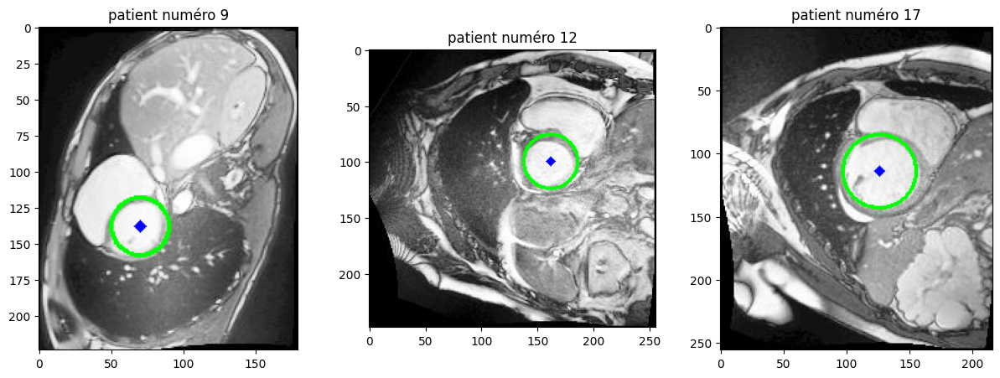

In [65]:
plt.figure(figsize=(15,5))

plt.subplot(1,3,1)
plt.title("patient numéro 9")
plt.imshow(all_images[9])

plt.subplot(1,3,2)
plt.title("patient numéro 12")
plt.imshow(all_images[12])

plt.subplot(1,3,3)
plt.title("patient numéro 17")
plt.imshow(all_images[17])

Pour ces patients, on a un résultat <span style='color:green'>optimal :</span> 
* Un centre au milieu du ventricule gauche 
* Un rayon qui englobe parfaitement le ventricule gauche. 

#### <span style='color:orange'><b>1.3.3. Patients pour le quel le centre a été détecté mais le rayon n'est pas correcte :

Text(0.5, 1.0, 'patient numéro 1')

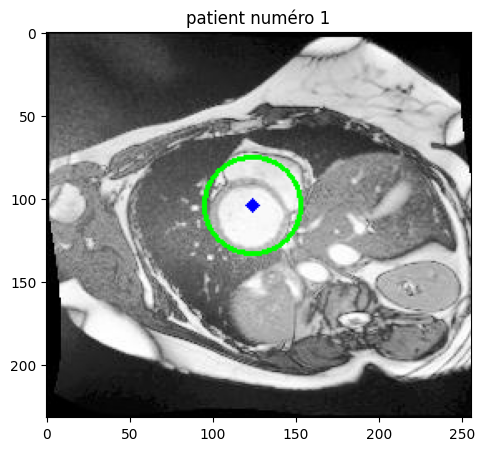

In [66]:
plt.figure(figsize=(15,5))
plt.imshow(all_images[1])
plt.title("patient numéro 1")


Bien que <span style='color:red'>le centre soit légèrement déplacé par rapprot au milieu du vnetricule gauche et que le rayon empiète sur certaines zones voisines du ventricule gauche</span>, le résultat reste inchangé et nous <span style='color:green'>**le retenons comme une bonne détection**.

#### <span style='color:orange'><b>1.3.4. Patients pour le quel le centre a été détecté en dehors du ventricule gauche et leurs pathologies : 

In [67]:
# Numéros des patients de mauvaise détection
not_in_center_patients

[10, 11, 34, 47]

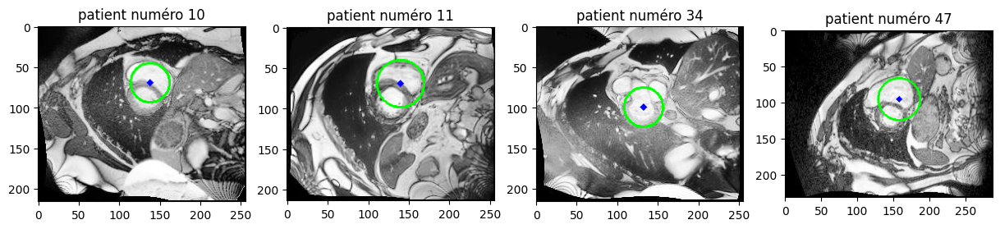

In [68]:
plt.figure(figsize=(15,5))

plt.subplot(1,4,1)
plt.title("patient numéro 10")
plt.imshow(all_images[10])

plt.subplot(1,4,2)
plt.title("patient numéro 11")
plt.imshow(all_images[11])

plt.subplot(1,4,3)
plt.title("patient numéro 34")
plt.imshow(all_images[34])

plt.subplot(1,4,4)
plt.title("patient numéro 47")
plt.imshow(all_images[47])

On remarque que les patients 10, 34 et 47 ont des centres à l'extérieur du ventricule gauche parce que les images IRM correspondantes à ces patients sont <span style='color:red'>**légèrement bruitées.** 

#### <span style='color:orange'><b>1.3.5. Patients pour le quel le centre n'a pas été détecté :

In [69]:
# Numéros des patients dont aucun centre n'a été détecté
not_detected_patients

[6, 14, 33]

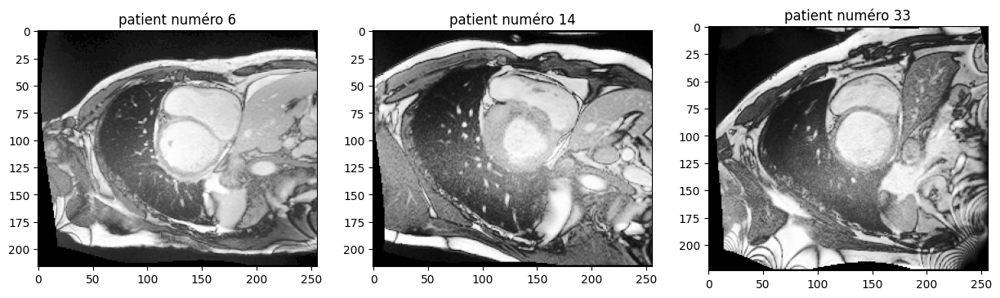

In [70]:
plt.figure(figsize=(15,5))

plt.subplot(1,3,1)
plt.title("patient numéro 6")
plt.imshow(all_images[6], cmap='gray')

plt.subplot(1,3,2)
plt.title("patient numéro 14")
plt.imshow(all_images[14], cmap='gray')

plt.subplot(1,3,3)
plt.title("patient numéro 33")
plt.imshow(all_images[33], cmap='gray')


On remarque une <span style='color:red'>grande ressemblance en niveau de gris entre le ventricule gauche et les zones adjacentes</span>. Cela va <u>**empêcher à Canny de bien détecter les limites du ventricule gauche**.</u> 

### <span style='color:blue'><b>1.4. Optimisation ultérieure : adjustement basé sur une liste de coupes définie en pourcentage plutôt que des entiers fixes : 

Au cours de notre démarche, on s'est demandé <u>si les résultats peuvent varier si au lieu de choisir une coupe en nombre entier fixe</u>, on **utilise des pourcentages**. Pour cela, on entraîne à nouveau notre modèle sur l'image de Fourier, en considérant les mêmes patients et les mêmes listes des paramètres.  

In [71]:
def optimal_params_dict_fourier(liste_param1, liste_param2, liste_slices = [1,2,3,4,5,6]):
    with open('Fourier_best_params_new.txt', 'w') as file:
        file.write('Fourier starting : \n')
    # Initialisation du compteur optimal et du dictionnaire de paramètres optimaux
    compteur_optimal = 0
    param_optimal = {
        'param1': None,
        'param2': None,
        'slice': None,
        'equalization': None
    }

    total_iter = len(liste_param1) * len(liste_param2) * len(liste_slices) * 100 * 2

    # Boucle sur toutes les combinaisons de paramètres
    with tqdm(total=total_iter, desc="Progression globale") as pbar:
        for eq in [True, False]:
            for param1 in liste_param1:            # liste des possibilités pour param1
                for param2 in liste_param2:        # liste des possibilités pour param2
                    for slice_ in liste_slices:    # liste des possibilités pour slice (définies en %)
                        compteur = 0               # Initialisation du compteur pour cette combinaison

                        # Boucle sur chaque patient
                        for patient in range(1, 101):
                            # Exécution de la fonction "detect_initial_sheet"
                            ns = get_data_from_patient(path_to_train_patient_nii(patient)).shape[-1]
                            initial_seed = detect_initial_seed_fourier(patient, int(slice_ * ns), param1, param2, eq) # La slice doit être un nombre entier, 
                                                                                                                      # donc on prend la partie entière du 
                                                                                                                      # pourcentage courant, multiplié par le 
                                                                                                                      # nombre de coupes du patient courant
                            
                            # Testing on the seed
                            if type(initial_seed) is int:
                                resultat = False
                            else:
                                resultat = center_within_gt_mask(patient, int(slice_ * ns), initial_seed)

                            # Supposons que "resultat" soit un booléen indiquant si le test est réussi
                            if resultat:  
                                compteur += 1
                            
                                
                            # Updating the tqdm bar
                            pbar.update(1)

                        # Vérification si le compteur actuel est meilleur que le compteur optimal
                        if compteur >= compteur_optimal:
                            compteur_optimal = compteur
                            param_optimal['param1'] = param1
                            param_optimal['param2'] = param2
                            param_optimal['slice'] = slice_
                            param_optimal['equalization'] = eq


                            # Save the local optimal parameters:
                            with open('Fourier_best_params_new.txt', 'a') as file:
                                file.write('\n')
                                json.dump(param_optimal, file, indent=4)  # The indent makes it more readable
                                file.write(f'\n last best optimal counter {compteur_optimal}')
                        


    return (param_optimal, compteur_optimal)

In [ ]:
# Fourier_best_params, fourier_best_cpt = optimal_params_dict_fourier(liste_param1=list(range(150, 211, 10)), liste_param2=list(range(30, 40, 2)), liste_slices=np.arange(0,1,0.1))

Progression globale:  65%|██████▍   | 45222/70000 [16:17:22<5:39:27,  1.22it/s] 

In [72]:
Fourier_best_params_pourc, Fourier_best_cpt_pourc = get_last_dictionary_and_counter('Fourier_best_params_new.txt')

In [73]:
print(f"Si on considère des slices en pourcentage au lieu d'un slice fixe, on obtient un compteur de `{Fourier_best_cpt_pourc}` patients dont le cercle a été détecté")

Si on considère des slices en pourcentage au lieu d'un slice fixe, on obtient un compteur de `90` patients dont le cercle a été détecté


## <span style='color:green'><b>2. Croissance de Région :

### <span style='color:blue'><b> 2.1. Définition des fonctions et importations nécessaires : 

La croissance de région se base sur le **centre détecté par Hough**, et il va se propager selon <u>une analyse de variation des intensitées.</u> 

Pour cela, la première étape qu'on considère c'est **l'initialisation de divers dictionnaire** qu'on va nommer en commentaire de code. 

In [74]:
# Initialisation : centre du LV détecté dans la coupe centrale pour la diastole
center_mid_slice_phase1 = {p : detect_initial_seed_fourier(p, best_fourier_params['slice'], best_fourier_params['param1'], best_fourier_params['param2'], equalize=best_fourier_params['equalization']) for p in range(1,101)}  # Liste des centre de la LV pour la coupe 3 de chaque patient
# Importation de toutes les données de patients de train
all_patients_data = {p : get_data_from_patient(path_to_train_patient_nii(p)) for p in range(1,101)} # Images de tous les patients

# Pour faciliter l'accès aux boucles, on définies les dictionnaires suivants aussi : 
# Nombre de phases pour chaque patient
num_phases = {p : all_patients_data[p].shape[0] for p in range(1,101)}  
# Nombre de coupes pour chaque patient
num_slices = {p : all_patients_data[p].shape[-1] for p in range(1,101)}  


#### <span style='color:orange'><b>2.1.1. Fonction de post-traitement et de coûts : 

Un des <span style='color:green'>**post-traitement**</span> qu'on va bien utiliser c'est la <span style='color:blue'>**fermeture morphologique**</span>. Enfaite, lorsqu'on possède des trous noirs à l'intérieur du ventricule gauche, ce traitement va les fermer. 

On va considérer <span style='color:blue'>**un disque**</span> comme **élément structurant**, dont <u>le rayon sera optimisé dans la phase d'entraînement</u>. 

In [75]:
def morphologic_transformation(image, kernel_size = 3):
    # Create a structuring element (kernel)
    # You can adjust the size of the kernel (3x3, 5x5, etc.) based on your needs
    plt.imsave('testingerosion.jpg', image)
    image = cv2.imread('testingerosion.jpg', cv2.IMREAD_GRAYSCALE)

    strell = morpho.disk(radius=kernel_size)

    return morpho.closing(image, strell)

In [76]:
# Fonction qui extrait le masque de vérité terrain pour un patient train donnée à l'instant diastolique
def extract_gt_mask(patient):
    return np.uint16(get_data_from_patient(path_to_gt_dystole_train_patient_nii(patient)) == 3)

Pour ce modèle 2D, les deux fonctions de coûts les plus adaptées sont la <span style='color:green'>**jaccard**</span> et <span style='color:green'>**le dice**.</span> 

* Le jaccard évalue une similitude entre la région prédite et le masque de vérité terrain. 
* Le dice est un indicateur moins sévère que le jaccard mais qui évalue la même quantité.

Il existe une relation simple entre dice et jaccard : $dice = 2 . \frac{jaccard}{jaccard+1}$

In [77]:
def jaccard_score(predicted_image, target_image, epsilon = 1e-04):
    # L'intersection est définie comme le nombre des pixels non nuls dans la multiplication terme par terme de la masque prédi par le masque de vérité terrain
    inter = np.count_nonzero(predicted_image * target_image) + epsilon
    # L'union est définie comme le nombre des pixels non nuls dans la somme terme par terme de la masque prédi par le masque de vérité terrain
    union = np.count_nonzero(predicted_image + target_image) + epsilon

    # Le jaccard c'est l'intersection des masques prédits et ceux réels sur l'union de la même quantité
    return inter/union

In [78]:
# Dice = 2 * jacc / (jacc + 1)
def dice_score(jac):
    return 2 * jac / (jac+1)

#### <span style='color:orange'><b>2.1.2. Fonction de croissance de région basée sur une intensité décroissante et entraînement : 

Maintenant on définit les fonctions de <span style='color:blue'>**croissance de région**</span>. On a recours à définir deux fonctions pour le modèle : 
* Une fonction qui va considérer un seuil fixe de détection : `region_growingNE`
* Une fonction qui va évaluer la croissance de région selon dfférents seuils, et tester s'il y a explosion de région pour arrêter la croissance : `region_growing_maskInten`

In [79]:
def region_growingNE(img, seed, threshold):
    # Dimensions de l'image
    rows, cols = img.shape
    # Image binaire pour marquer les régions visitées
    visited = np.zeros_like(img, dtype=bool)
    # Masque pour la région extraite (similaire à la sortie de flood)
    mask = np.zeros_like(img, dtype=bool)
    # File d'attente pour les pixels à visiter (file FIFO)
    queue = deque([seed])
    # Marquage du seed comme visitée
    visited[seed] = True
    mask[seed] = True  # Marquage du seed dans le masque
    # Liste des déplacements pour les 4 voisins (haut, bas, gauche, droite)
    neighbors = [(-1, 0), (1, 0), (0, -1), (0, 1)]
    # Boucle de croissance de région
    while queue:
        x, y = queue.popleft()
        # Parcourir les 4 voisins
        for dx, dy in neighbors:
            nx, ny = x + dx, y + dy
            if 0 <= nx < rows and 0 <= ny < cols:
                # Vérifier si le pixel n'a pas été visité et s'il satisfait le seuil
                if not visited[nx, ny] and img[nx, ny] >= threshold:
                    visited[nx, ny] = True
                    mask[nx, ny] = True  # Ajouter au masque
                    queue.append((nx, ny))
    return mask

def region_growing_maskInten(patient, slc, frame, all_seeds, vr = 1.5, median_radious = 1, morpho = False, equalization = False):
    # Importation des données 
    data_patient = all_patients_data[patient][0,:,:,slc]
    # Enregistrement de l'image pour la conversion en format OpenCV
    plt.imsave('image.jpg', data_patient)
    image = cv2.imread('image.jpg', cv2.IMREAD_GRAYSCALE)
    im = image
    # Egalisation de l'image
    if equalization:
        image = histogram_equalization(im)
    image = median_filter(image, typ=2, r=median_radious)

    # Initialisation de l'image de masque de croissance de région
    flooded_image = np.zeros_like(image)

    # Initialisation du point de croissance initial (Centre détecté par Hough)
    seed_point = (all_seeds[patient][slc][1], all_seeds[patient][slc][0]) 
    new_val = 255  # Couleur blanche pour la zone du masque

    # Conversion de l'image pour le traitement avec skio
    image_float = image.astype(float)
    
    height, width = image_float.shape

    # Calcul du maximum de rayon de croissance pour que la région ne sorte pas de l'image et donne des erreurs 
    max_radius = min(seed_point[0], seed_point[1], height - seed_point[0] - 1, width - seed_point[1] - 1, 5)

    # Créer un disk pour limier la région
    rr, cc = disk(seed_point, max_radius, shape=image_float.shape)

    # Calcul de l'intensité moyenne présente dans le disque
    initial_threshold = np.mean(image_float[rr, cc])

    min_threshold = 0        # Seuil minimal à ne pas dépasser
    threshold_decrease = 1    # Valeur par laquelle diminuer le seuil

    # Stocker les volumes à chaque étape
    volumes = []
    thresholds = []
    mask=[]
    mskold=[]
    # Itérer sur les seuils décroissants
    while initial_threshold >= min_threshold:
        # Appliquer la méthode de croissance de région
        mskold = mask
        mask = region_growingNE(image_float, seed_point, initial_threshold)
        
        # Calculer le volume segmenté (nombre de pixels dans le masque)
        volume = np.sum(mask)
        volumes.append(volume)
        thresholds.append(initial_threshold)

        # Diminuer le seuil pour la prochaine itération
        initial_threshold -= threshold_decrease  

        # Vérifier s'il y a une discontinuité dans le volume
        if len(volumes) > 1:  # S'assurer qu'il y a au moins deux volumes pour comparer
            volume_ratio = volumes[-1] / volumes[-2]
            if volume_ratio > vr:  # Détecter une explosion de région                
                break  # Sortir de la boucle si une discontinuité est trouvée
            
    
    # Colorier le masque trouvé sur l'image résultat
    flooded_image[mskold] = new_val
    
    non_zero_values = image[flooded_image > 0]  
    # Calcul de la moyenne et variance de la zone détectée pour la propagation en futur 
    # (on va modifier seulement des choses élémentaires telque des numéro de slice et frame pour la propagation)
    LVmean = np.mean(non_zero_values)
    LVstd = np.std(non_zero_values)
    
    # Appliquer la fermeture morphologique si et seulement si sa valeur n'est pas Faux
    if morpho:
        mskold = morphologic_transformation(mskold, morpho) > 128

    # Retour du masque détecté, et le tuple contenant la moyenne et la variance de la zone définie par le masque
    return [mskold, (LVmean, LVstd)]

Maintenant on définit la fonction qui va nous donner les **masques calculés** *(un seul masque pour cette section)* de croissance de région. On va donc détailler la fonction cette première fois et puis on va détailler les changements dans chaque nouvelle définition.

In [80]:
def propagate_seeds_and_masks_Inten(vr, median_r, morpho, eq, best_slice = 1, all_patients = list(range(1,101))):
    # Initialisation du dictionnaire qui définit les centres détectés pour chaque patient:
    all_seeds = dict()
    # Initialisation du dictionnaire qui définit les masques calculés pour chaque patient:
    all_masks = dict()
    # Initialisation du dictionnaire qui définit les moyennes et variances des masques détectés pour chaque patient, qu'on aura besoin pour la propagation:
    all_prevs = dict()

    # Parcours de tous les patients 
    for p in all_patients:
        # Initialisation des listes des valeurs détectées pour un patient donné à des listes des zéros
        all_seeds[p] = [0] * (num_slices[p])
        all_masks[p] = [0] * (num_slices[p])
        all_prevs[p] = [0] * (num_slices[p])
        
        # On ne calcule le region growing que si un centre de Hough a été détecté.
        if type(center_mid_slice_phase1[p]) is int:
            all_masks[p][best_slice] = np.zeros_like(all_patients_data[p][0,:,:,best_slice])
        else : 
            # Le premier seed détecté pour cette étape est le centre détecté par Hough. 
            # Ici on va utiliser seulement l'indice de la coupe optimale : best_slice. Plutard il y aura les indices des autres coupes pour la propagation.
            all_seeds[p][best_slice] = list(center_mid_slice_phase1[p])
            # On calcule le region growing pour les paramètres fixés, et le zéro indique qu'il s'agit de la diastole
            loc = region_growing_maskInten(p, best_slice, 0, all_seeds, vr, median_r, morpho, eq)
            # On met à jour le masque, la moyenne et la variance du patient p
            all_masks[p][best_slice] = loc[0]
            all_prevs[p][best_slice] = loc[1]

    return all_seeds, all_prevs, all_masks

Ensuite, nous <u>antraînons</u> le modèle précédement défini en suivant la même procédure qu'auparavant. Les paramètres qui varient ici sont : 
* Le rapport de volume pour lequel on décide si on a explosion de croissance ou pas 
* Le rayon du disque poue le filtre médian 
* L'activation ou non de l'égalisation
* Le rayon du disque pour la fermeture morphologique si celle-ci est appliquée. 

Ici notre fonction de coût est le jaccard, mais on va visualiser les résultats futurs avec le jaccard et le dice ensemble.

In [81]:
def best_region_propagation_mean_intensity(vrs, mrs, morpho_radii, best_slice = 1, all_patients = range(1,101)):
    # Création nouveau fichier 
    with open('Intensity_best_params.txt', 'a') as file:
        file.write('New Intensity starting : \n')
    # Initialisation du Jaccard maximal et du dictionnaire de paramètres optimaux
    jaccard_maximal = 0
    
    param_optimal = {
        'VolumeRatio': None,
        'MedianRadius': None,
        'Equalization': None,
        'Morpho': None
    }

    # Calcul du nombre total d'itérations pour la barre de progression
    total_iterations = len(vrs) * len(mrs) * 2 * len(morpho_radii) 

    # Boucle sur toutes les combinaisons de paramètres
    with tqdm(total=total_iterations, desc="Progression globale") as pbar:
        for vr in vrs:
            for med in mrs:
                for eq in [True, False]:
                    for mr_radius in morpho_radii:
                        _, _, all_masks = propagate_seeds_and_masks_Inten(vr, med, mr_radius, eq, best_slice, all_patients=all_patients)
                        # Initialisation d'une liste de jaccards pour chaque patient pour calculer sa moyenne comme indicateur de performance
                        all_jaccards = []
                        # itération sur tous les patients 
                        for p in all_patients:
                            # Liste des jaccards pour chaque coupe du patient p (une seule coupe dans cette partie)
                            jaccard_list = []
                            msks = extract_gt_mask(p) # Extraction du masque de vérité terrain
                            simplified_masks_list = all_masks[p] # Liste des masques de toutes les coupes de p (une seule)
                    
                            # Parcours sur chaque coupe (principale seulement)
                            for i in [best_slice]:
                                # Concaténation avec les jaccard pour la coupe considérée
                                jaccard_list.append(jaccard_score(simplified_masks_list[i], msks[:,:,i]))
                            # Calcule du jaccard moyen pour le patient p
                            all_jaccards.append(np.mean(np.array(jaccard_list)))
                        
                        # Calcule du jaccard moyen pour tous les patients 
                        jaccard_total = np.mean(np.array(all_jaccards))  

                        # Mise à jour du Jaccard maximal et des paramètres optimaux
                        if jaccard_total > jaccard_maximal:
                            jaccard_maximal = jaccard_total
                            param_optimal['VolumeRatio'] = vr
                            param_optimal['MedianRadius'] = med
                            param_optimal['Equalization'] = eq
                            param_optimal['Morpho'] = mr_radius

                            # Save the local optimal parameters:
                            with open('Intensity_best_params.txt', 'a') as file:
                                file.write('\n')
                                json.dump(param_optimal, file, indent=4) 
                                file.write(f'\n last best optimal counter {jaccard_maximal}')

                        # Mise à jour de la barre de progression 
                        pbar.update(1)

    # Retour des résultats
    return param_optimal, jaccard_maximal

Comme précédement, on réduit le maximum le nombre de paramètres à considérer selon des expériences multiples. 

In [ ]:
#best_region_propagation_mean_intensity(vrs=[1.5, 1.6, 1.7, 1.8], mrs=[1, 2, 3, 4], morpho_radii= [False] + list(range(1, 5, 1)), best_slice=best_fourier_params['slice'], all_patients=list(range(1,101)))
#best_region_propagation_mean_intensity(vrs=[1.6, 1.7, 1.8], mrs=[1, 2, 3, 4], morpho_radii= [False] + list(range(1, 5, 1)), best_slice=best_fourier_params['slice'], all_patients=list(range(1,101)))

Progression globale: 100%|██████████| 120/120 [4:36:30<00:00, 138.25s/it] 


({'VolumeRatio': 1.7,
  'MedianRadius': 4,
  'Equalization': False,
  'Morpho': False},
 0.6028968493597872)

In [82]:
# Extraction des paramètres optimaux de ce modèle et du résultat (jaccard moyen) obtenu
best_region_intensity_params, best_region_intensity_cpt = get_last_dictionary_and_counter('Intensity_best_params.txt')

In [83]:
print(f"Le meilleur jaccard obtenu par la méthode de croissance de l'intensité est : {best_region_intensity_cpt} dont le dice est {dice_score(float(best_region_intensity_cpt))}")
print(f"Avec les paramètres : {best_region_intensity_params}")

Le meilleur jaccard obtenu par la méthode de croissance de l'intensité est : 0.6028968493597872 dont le dice est 0.7522590734401781
Avec les paramètres : {'VolumeRatio': 1.7, 'MedianRadius': 4, 'Equalization': False, 'Morpho': False}


#### <span style='color:orange'><b>2.1.3. Fonction de croissance de région basée sur une tolérance d'intensité croissante et entraînement : 

Pour la fonction précédente, un **étirement d'histogramme** ne va pas varier les résultats. Pour cette méthode par contre on doit faire un étirement d'hsitogramme à cause de <span style='color:red'>la sensibilité de variation de tolérance aux intensités des pixels</span>. 

Pour cela, mieux que l'étirement classique on exécuté un étirement sur <u>**l'image dont l'histogramme contient 98% de l'histogramme original**</u>, en **éliminant** la première et la dernière percentile. Cette méthode a donné des résultats <span style='color:green'>légèrement meilleurs</span> par l'expérience.

In [84]:
def stretch(im):
    # On calcule la première et la dernière percentile
    p1 = np.percentile(im, 1)
    p99 = np.percentile(im, 99)

    # On coupe l'image à ces percentiles 
    im_clipped = np.clip(im, p1, p99)

    # On étire l'image coupée (min -> 0 et max -> 255)
    stretched = (((im_clipped - im_clipped.min()) / (im_clipped.max() - im_clipped.min())) * 255).astype('uint8')

    return stretched


Maintenant on définit notre modèle, qui est presque en tout similaire à l'ancien modèle, seulement qu'au lieu d'avoir deux fonctions en en utilise une **seule**, et on utilise la fonction prête de OpenCV `flood` qui prend comme paramètres : 
* L'image d'origine
* Le centre de départ 
* Une tolérance (similaire à un seuil). 

Nous allons commenter seulement la nouvelle partie de cette fonction.

In [85]:
def region_growing_mask_Flood(patient, slc, frame, all_seeds, vr = 1.5, median_radious = 1, morpho = False, initial_tolerance=5, equalization = False):
    data_patient = all_patients_data[patient][0,:,:,slc]
    plt.imsave('image.jpg', data_patient)
    image = cv2.imread('image.jpg', cv2.IMREAD_GRAYSCALE)
    im = stretch(image)
    if equalization:
        image = histogram_equalization(im)
    image = median_filter(image, typ=2, r=median_radious)

    flooded_image = np.zeros_like(image)

    seed_point = (all_seeds[patient][slc][1], all_seeds[patient][slc][0]) 
    new_val = 255  
    image_float = image.astype(float)
    
    # Seuil initial du flood
    initial_threshold = initial_tolerance

    max_threshold = 60             # Seuil maximal à ne pas dépasser
    threshold_increse = 1           # Valeur par laquelle diminuer le seuil

    # Stocker les volumes à chaque étape
    volumes = []
    thresholds = []
    mask=[]
    mskold=[]
    # Itérer sur les seuils décroissants
    while initial_threshold <= max_threshold:
        # Appliquer la méthode de croissance de région 'flood'
        mskold = mask
        mask = flood(image_float, seed_point, tolerance = initial_threshold)  # Adjust tolerance as needed
        
        # Calculer le volume segmenté (nombre de pixels dans le masque)
        volume = np.sum(mask)
        volumes.append(volume)
        thresholds.append(initial_threshold)

        # Diminuer le seuil pour la prochaine itération
        initial_threshold += threshold_increse  # Diminuer le seuil
        # Vérifier s'il y a une discontinuité dans le volume
        if len(volumes) > 1:  # S'assurer qu'il y a au moins deux volumes pour comparer
            volume_ratio = volumes[-1] / volumes[-2]
            if volume_ratio > vr:  # Détecter un bond important 
                break  # Sortir de la boucle si une discontinuité est trouvée
        
    
    flooded_image[mskold] = new_val
    
    non_zero_values = image[flooded_image > 0]  
    LVmean = np.mean(non_zero_values)
    LVstd = np.std(non_zero_values)

    if morpho:
        mskold = morphologic_transformation(mskold, morpho)>128
    return [mskold, (LVmean, LVstd)]

La **fonction de calcul des masques est la même qu'avant**, on modifie seulement la fonction de croissance de région à l'intérieur

In [86]:
def propagate_seeds_and_masks_Flood(vr, median_r, morpho, init_tol, eq, best_slice = 1, all_patients = list(range(1,101))):
    # Init:
    all_seeds = dict()
    all_masks = dict()
    all_prevs = dict()
    for p in all_patients:
        all_seeds[p] = [0] * (num_slices[p] - num_slices[p]//3)
        all_masks[p] = [0] * (num_slices[p] - num_slices[p]//3)
        all_prevs[p] = [0] * (num_slices[p] - num_slices[p]//3)
        
        if type(center_mid_slice_phase1[p]) is int:
            all_masks[p][best_slice] = np.zeros_like(all_patients_data[p][0,:,:,best_slice])
        else : 
            all_seeds[p][best_slice] = list(center_mid_slice_phase1[p])
            loc = region_growing_mask_Flood(p, best_slice, 0, all_seeds, vr, median_r, morpho, init_tol, eq) # Changement de fonction
            all_masks[p][best_slice] = loc[0]
            all_prevs[p][best_slice] = loc[1]

    return all_seeds, all_prevs, all_masks

Même la fonction d'optimisation des paramètres reste la même avec changement de **fonction de calcul des masques** à l'interieur et le **nom de fichier**.

In [87]:
def best_region_propagation_flood(vrs, mrs, morpho_radii, init_tols, best_slice = 1, all_patients = range(1,101)):
    # Changement de nom de fichier
    with open('Flood_best_params.txt', 'w') as file:
        file.write('Flood starting : \n')

    jaccard_maximal = 0
    
    param_optimal = {
        'VolumeRatio': None,
        'MedianRadius': None,
        'Equalization': None,
        'Morpho': None,
        'Initial tolerance': None
    }

    # Calcul du nombre total d'itérations pour la barre de progression
    total_iterations = len(vrs) * len(mrs) * 2 * len(morpho_radii) * len(init_tols)

    # Boucle sur toutes les combinaisons de paramètres
    with tqdm(total=total_iterations, desc="Progression globale") as pbar:
        for init_tol in init_tols:
            for vr in vrs:
                for med in mrs:
                    for eq in [True, False]:
                        for mr_radius in morpho_radii:

                            _, _, all_masks = propagate_seeds_and_masks_Flood(vr, med, mr_radius, init_tol, eq, best_slice, all_patients=all_patients) # Changement de fonction
                            all_jaccards = []
                            for p in all_patients:
                                jaccard_list = []
                                msks = extract_gt_mask(p)
                                simplified_masks_list = all_masks[p]
                        
                                for i in [best_slice]:
                                    jaccard_list.append(jaccard_score(simplified_masks_list[i], msks[:,:,i]))
                                all_jaccards.append(np.mean(np.array(jaccard_list)))
                            
                            jaccard_total = np.mean(np.array(all_jaccards))  
                            #print(jaccard_total, ' ', mr_radius, ' ', eq, ' ', med,' ',vr)
                            # Mise à jour du Jaccard maximal et des paramètres optimaux
                            if jaccard_total > jaccard_maximal:
                                jaccard_maximal = jaccard_total
                                param_optimal['VolumeRatio'] = vr
                                param_optimal['MedianRadius'] = med
                                param_optimal['Equalization'] = eq
                                param_optimal['Morpho'] = mr_radius
                                param_optimal['Initial tolerance'] = init_tol

                                # Save the local optimal parameters:
                                with open('Flood_best_params.txt', 'a') as file:
                                    file.write('\n')
                                    json.dump(param_optimal, file, indent=4)  # The indent makes it more readable
                                    file.write(f'\n last best optimal counter {jaccard_maximal}')
                            # Mise à jour de la barre de progression globale
                            pbar.update(1)

    # Retour des résultats
    return param_optimal, jaccard_maximal

On entraîne le modèle avec les **mêmes paramètres**. Nous allons changer seulement la liste des seuils d'intensité par **la liste de tolérances**.

In [43]:
#best_region_propagation_flood(vrs=[1.5, 1.6, 1.7, 1.8], mrs=[1, 2, 3, 4], morpho_radii=[False]+ list(range(1, 5, 1)), init_tols=[7,9,11,12,13,14,15,17,20] , best_slice=1)

In [88]:
# Extraction des paramètres optimaux
best_flood_params, best_flood_mean_jaccard = get_last_dictionary_and_counter('Flood_best_params.txt')

In [89]:
print(f"Le meilleur jaccard obtenu par la méthode de croissance de la tolérance est : {best_flood_mean_jaccard} dont le dice est : {dice_score(float(best_flood_mean_jaccard))}")
print(f"Avec les paramètres : {best_flood_params}")

Le meilleur jaccard obtenu par la méthode de croissance de la tolérance est : 0.7944348161625182 dont le dice est : 0.8854429361345694
Avec les paramètres : {'VolumeRatio': 1.6, 'MedianRadius': 4, 'Equalization': True, 'Morpho': 2, 'Initial tolerance': 7}


On remarque bien que <span style='color:green'>**le modèle basée sur une tolérance croissante fonctionne mieux que l'autre**</span>. On va donc retenir seulement le modèle de `flood` qu'on va tester  sur le jeu de données `test`.

#### <span style='color:orange'><b>2.1.4. Test de la fonction de croissance de région basée sur une intensité décroissante : 

In [90]:
# Initialisation : centre du LV détecté dans la slice centrale et à la diastole pour les données du test
center_mid_slice_phase1_test = {p : detect_initial_seed_fourier_test(p, best_slice, hough_param1, hough_param2, equalize=hough_eq) for p in range(1,51)}  # Liste des centre de la LV pour la coupe 3 de chaque patient
all_patients_data_test = {p : get_data_from_patient(path_to_test_patient_nii(p)) for p in range(1,51)} # Images de tous les patients

# Variables :
num_phases_test = {p : all_patients_data_test[p].shape[0] for p in range(1,51)}  # total frames (temporal)
num_slices_test = {p : all_patients_data_test[p].shape[-1] for p in range(1,51)}  # total slices (spatial)


In [91]:
# Fonction d'extraction de masque de vérité terrain pour les données de test
def extract_gt_mask_test(patient):
    return np.uint16(get_data_from_patient(path_to_gt_dystole_test_patient_nii(patient)) == 3)

On réécrit la même fonction qu'avant, juste en changeant la data considérée (`test`)

In [92]:
def region_growing_mask_Flood_test(patient, slc, frame, all_seeds, vr = 1.5, median_radious = 1, morpho = False, initial_tolerance=5, equalization = False):
    data_patient = all_patients_data_test[patient][0,:,:,slc] # Changement de données en données de test
    plt.imsave('image.jpg', data_patient)
    image = cv2.imread('image.jpg', cv2.IMREAD_GRAYSCALE)
    im = stretch(image)
    if equalization:
        image = histogram_equalization(im)
    image = median_filter(image, typ=2, r=median_radious)

    flooded_image = np.zeros_like(image)

    seed_point = (all_seeds[patient][slc][1], all_seeds[patient][slc][0]) 
    new_val = 255  
    image_float = image.astype(float)
    
    # Seuil initial du flood
    initial_threshold = initial_tolerance

    max_threshold = 60             # Seuil maximal à ne pas dépasser
    threshold_increse = 1           # Valeur par laquelle diminuer le seuil

    # Stocker les volumes à chaque étape
    volumes = []
    thresholds = []
    mask=[]
    mskold=[]
    # Itérer sur les seuils décroissants
    while initial_threshold <= max_threshold:
        # Appliquer la méthode de croissance de région 'flood'
        mskold = mask
        mask = flood(image_float, seed_point, tolerance = initial_threshold)  # Adjust tolerance as needed
        

        # Calculer le volume segmenté (nombre de pixels dans le masque)
        volume = np.sum(mask)
        volumes.append(volume)
        thresholds.append(initial_threshold)

        # Diminuer le seuil pour la prochaine itération
        initial_threshold += threshold_increse  # Diminuer le seuil

        # Vérifier s'il y a une discontinuité dans le volume
        if len(volumes) > 1:  # S'assurer qu'il y a au moins deux volumes pour comparer
            volume_ratio = volumes[-1] / volumes[-2]
            if volume_ratio > vr:  # Détecter un bond important 
                break  # Sortir de la boucle si une discontinuité est trouvée
    
    flooded_image[mskold] = new_val
    
    non_zero_values = image[flooded_image > 0]  
    LVmean = np.mean(non_zero_values)
    LVstd = np.std(non_zero_values)

    if morpho:
        mskold = morphologic_transformation(mskold, morpho)>128
    return [mskold, (LVmean, LVstd)]

In [93]:
def propagate_seeds_and_masks_Flood_test(vr, median_r, morpho, init_tol, eq, best_slice = 1, all_patients = list(range(1,51))):
    # Init:
    all_seeds = dict()
    all_masks = dict()
    all_prevs = dict()
    for p in all_patients:
        all_seeds[p] = [0] * (num_slices[p] - num_slices[p]//3)
        all_masks[p] = [0] * (num_slices[p] - num_slices[p]//3)
        all_prevs[p] = [0] * (num_slices[p] - num_slices[p]//3)
        
        if type(center_mid_slice_phase1_test[p]) is int:
            all_masks[p][best_slice] = np.zeros_like(all_patients_data_test[p][0,:,:,best_slice])
        else : 
            all_seeds[p][best_slice] = list(center_mid_slice_phase1_test[p])
            loc = region_growing_mask_Flood_test(p, best_slice, 0, all_seeds, vr, median_r, morpho, init_tol, eq) # Changement de fonction
            all_masks[p][best_slice] = loc[0]
            all_prevs[p][best_slice] = loc[1]
            #print(all_prevs)

    return all_seeds, all_prevs, all_masks

In [94]:
# Extraction des paramètres optimaux
region_vr, region_med, region_eq, region_morpho, region_it = best_flood_params.values()

In [95]:
# Evaluation des masques de croissance de région pour tous les patients de test
_, _, all_masks = propagate_seeds_and_masks_Flood_test(region_vr, region_med, region_morpho, region_it, region_eq, best_slice, all_patients=list(range(1,51))) 

In [96]:
# Calcul des jaccards et des patients détectés 
all_jaccards = []
all_detected_pats = []
for p in range(1,51):
    jaccard_list = []
    msks = extract_gt_mask_test(p)
    simplified_masks_list = all_masks[p]

    for i in [best_slice]:
        js = jaccard_score(simplified_masks_list[i], msks[:,:,i])
        if(type(center_mid_slice_phase1_test[p]) is not int) :
            if (js > 10**(-6)) &  (center_within_gt_mask_test(p, best_slice, center_mid_slice_phase1_test[p])):
                jaccard_list.append(js)
    if jaccard_list != []:
        all_jaccards.append(np.mean(np.array(jaccard_list)))
        all_detected_pats.append(p)

jaccard_total = np.mean(np.array(all_jaccards)) 
print(f"Le jaccard moyen de tous les patients de test est : {jaccard_total} dont le dice est {dice_score(float(jaccard_total))}")

Le jaccard moyen de tous les patients de test est : 0.8023836477128572 dont le dice est 0.890358330459828


Nous avons obtenu <span style='color:green'>**un jaccard assez satisfaisant**</span> avec <span style='color:green'>**un dice assez proche de 1**</span>. Nous allons  visualiser donc les régions détectées pour chaque patient.

### <span style='color:blue'><b> 2.2. Visualisation des régions estimées : 

Pour une bonne **intérprétation visuelle**, on associe à chaque patient son indice de Jaccard, et puis on trie la liste des couples (patient, jaccard) par ordre de jaccard croissant.

In [97]:
pat_jacc_list = []
for p, j in zip(all_detected_pats, [round(j*100, 2) for j in all_jaccards]):
    pat_jacc_list.append((p, j))
pat_jacc_list.sort(key = lambda i : i[1])
print(pat_jacc_list)

[(16, 0.58), (26, 3.75), (13, 40.92), (1, 42.35), (5, 52.37), (12, 61.98), (46, 70.83), (45, 71.36), (20, 76.28), (38, 76.36), (22, 77.41), (4, 78.02), (18, 78.08), (24, 78.88), (29, 79.68), (42, 83.7), (23, 83.88), (2, 85.47), (3, 86.39), (32, 87.88), (27, 89.29), (39, 89.56), (19, 89.6), (8, 89.81), (50, 90.25), (41, 90.73), (28, 90.93), (25, 91.49), (40, 91.53), (15, 92.22), (44, 92.34), (21, 92.39), (37, 92.61), (30, 93.49), (35, 94.17), (17, 94.4), (36, 94.48), (43, 94.72), (31, 94.77), (48, 94.85), (9, 95.5), (49, 96.99), (7, 97.95)]


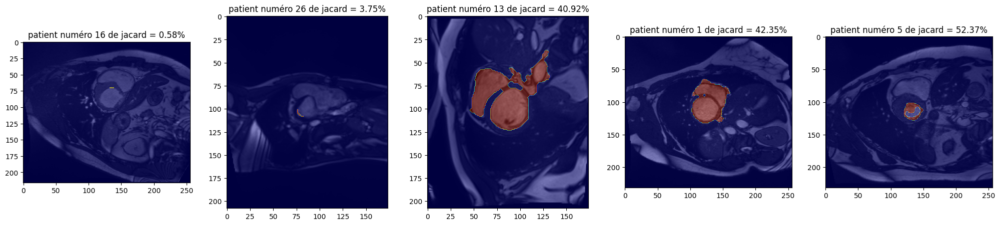

In [98]:
# Affichage des 5 patients qui possèdent les pires jaccards
plt.figure(figsize=(25,5))

for i in range(5):
    pat, jac = pat_jacc_list[i]

    mask = all_masks[pat]

    plt.subplot(1,5,i+1)
    plt.imshow(all_patients_data_test[pat][0, :, :, best_slice], cmap='gray')
    plt.imshow(all_masks[pat][best_slice],cmap='jet', alpha = 0.5)
    plt.title(f"patient numéro {pat} de jacard = {jac}%")


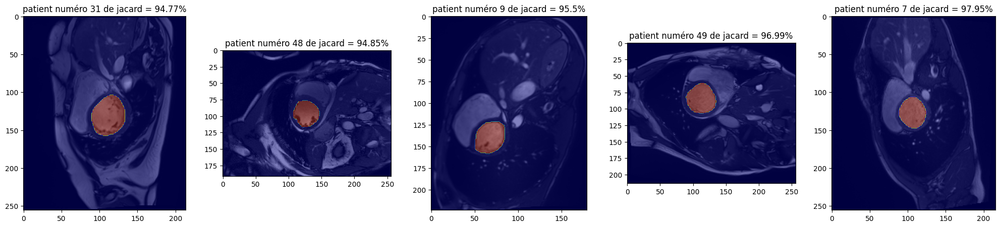

In [99]:
# Affichage des 5 patients qui possèdent les meilleurs jaccards
plt.figure(figsize=(25,5))

for i in range(5):
    pat, jac = pat_jacc_list[len(pat_jacc_list)-5+i]

    mask = all_masks[pat]

    plt.subplot(1,5,i+1)
    plt.imshow(all_patients_data_test[pat][0, :, :, best_slice], cmap='gray')
    plt.imshow(all_masks[pat][best_slice], cmap='jet', alpha = 0.5)
    plt.title(f"patient numéro {pat} de jacard = {jac}%")


### <span style='color:blue'><b>2.3. Test sur l'effet du pré-traitement et post-traitement sur les résultats : 

On a décidé de tester nos méthodes en éliminant les pré et post traitement, pour <u>s'assurer du bénéfice de leurs présences</u> : 

In [100]:
# Region growing sans aucun pré-traitement (égalisation = False et filtre médian rayon = 1) et post-traitement (filtre morphologique = False)
_, _, all_masks_without = propagate_seeds_and_masks_Flood_test(region_vr, 1, False, region_it, False, best_slice, all_patients=list(range(1,51)))

# Region growing avec pré-traitement (égalisation et filtre médian) et sans post-traitement (filtre morphologique)
_, _, all_masks_preprecessing_only = propagate_seeds_and_masks_Flood_test(region_vr, region_med, False, region_it, region_eq, best_slice, all_patients=list(range(1,51)))

# Region growing avec pré-traitement (égalisation et filtre médian) et post-traitement (filtre morphologique)
_, _, all_masks_complete = propagate_seeds_and_masks_Flood_test(region_vr, region_med, region_morpho, region_it, region_eq, best_slice, all_patients=list(range(1,51))) 

In [101]:
# Evaluation des jaccards et dices pour chacune des 3 croissances de région définies avant :
all_jaccards_without = []
all_jaccards_preproc = []
all_jaccards = []
for p in range(1,51):
    jaccard_list = []
    jaccard_list_without = []
    jaccard_list_preproc = []
    msks = extract_gt_mask_test(p)

    simplified_masks_list = all_masks_complete[p]
    simplified_masks_list_without = all_masks_without[p]
    simplified_masks_list_preproc = all_masks_preprecessing_only[p]

    for i in [best_slice]:
        js = jaccard_score(simplified_masks_list[i], msks[:,:,i])
        if(type(center_mid_slice_phase1_test[p]) is not int) :
            if (js > 10**(-6)) &  (center_within_gt_mask_test(p, best_slice, center_mid_slice_phase1_test[p])):
                jaccard_list.append(js)
    for i in [best_slice]:
        js = jaccard_score(simplified_masks_list_without[i], msks[:,:,i])
        if(type(center_mid_slice_phase1_test[p]) is not int) :
            if (js > 10**(-6)) &  (center_within_gt_mask_test(p, best_slice, center_mid_slice_phase1_test[p])):
                jaccard_list_without.append(js)
    for i in [best_slice]:
        js = jaccard_score(simplified_masks_list_preproc[i], msks[:,:,i])
        if(type(center_mid_slice_phase1_test[p]) is not int) :
            if (js > 10**(-6)) &  (center_within_gt_mask_test(p, best_slice, center_mid_slice_phase1_test[p])):
                jaccard_list_preproc.append(js)
            
    if jaccard_list != []:
        all_jaccards.append(np.mean(np.array(jaccard_list)))
    if jaccard_list_without != []:
        all_jaccards_without.append(np.mean(np.array(jaccard_list_without)))
    if jaccard_list_preproc != []:
        all_jaccards_preproc.append(np.mean(np.array(jaccard_list_preproc)))

jaccard_total = np.mean(np.array(all_jaccards)) 
jaccard_total_without = np.mean(np.array(all_jaccards_without)) 
jaccard_total_preproc = np.mean(np.array(all_jaccards_preproc)) 
print(f"Le jaccard moyen de tous les patients de test sans pré et post traitement est : {jaccard_total_without} et de dice moyen : {dice_score(jaccard_total_without)}")
print(f"Le jaccard moyen de tous les patients de test avec pré-traitement seulement est : {jaccard_total_preproc} et de dice moyen : {dice_score(jaccard_total_preproc)}")
print(f"Le jaccard moyen de tous les patients de test avec pré et post traitement est : {jaccard_total} et de dice moyen : {dice_score(jaccard_total)}")

Le jaccard moyen de tous les patients de test sans pré et post traitement est : 0.6834999508676639 et de dice moyen : 0.8119987773274278
Le jaccard moyen de tous les patients de test avec pré-traitement seulement est : 0.8020828615915364 et de dice moyen : 0.8901731198788106
Le jaccard moyen de tous les patients de test avec pré et post traitement est : 0.8023836477128572 et de dice moyen : 0.890358330459828


On remarque : 
* Une forte <span style='color:red'>**baisse**</span> du jaccard lorsqu'on ne fait <u>aucun traitement</u>?
* Une <span style='color:red'>**très légère baisse**</span> si on élimine la fermeture morphologique. 
 
Cela indique que <span style='color:green'>**ces traitements sont importants.**

## <span style='color:green'><b>3. Propagation du centre :

### <span style='color:blue'><b>3.1. Définition des fonctions et coût nécessaires à la propagation :

Suite aux résultats précédents, **nous avons obtenus des centres assez biens détéctés et des régions de ventricule gauche initiales assez bonnes**. 

Pour cela, nosu passons à l'étape finale qui est <u>**la propagation du centre d'une coupe à l'autre**</u>. La méthode de propagation qu'on va adopter est basée sur une fonction de <span style='color:blue'>**minimisation d'énergie**</span> sur une fenêtre donnée.

In [102]:
# Fonction qui calcule l'énergie d'un point considéré en fonction de la moyenne et variance de la zone précédente
def calculate_energy(p, p_CoG, I_new_p, sigma_prev, mu_prev):
    
    # Terme de distance 
    distance_term = np.linalg.norm(np.array(p_CoG) - np.array(p)) 
    if sigma_prev != 0:
        first_term = (1 / (2 * (sigma_prev ** 2))) * distance_term
    else:
        first_term = 0  
    
    # Terme d'intensité
    second_term = (I_new_p - mu_prev) ** 2
    
    # Somme des deux termes = energie
    energy = first_term + second_term
    
    return energy

In [103]:
# Fonction qui vérifie si un pixel appartient à l'image (nécessaire pour la fenêtre de propagation)
def is_within_bounds(new_image, p):
    
    x, y = p
    
    image_height, image_width = new_image.shape[:2]  
    
    if 0 <= x < image_height and 0 <= y < image_width:
        return True
    else:
        return False

La fonction ci-dessous est la fonction de <span style='color:blue'>**propagation de centre**</span>. Elle prend comme paramètres : 
* Le patient et slice sur le quel on est entrain de travailler
* L'image IRM courante
* Les dictionnaires des seeds, masques, moyennes et variances d'intensités (on va considérer toujours la moyenne et variance de la coupe centrale de diastole seulement)
* La coupe optimale  
* La taille de la fenêtre

In [104]:
def seed_propagation(patient, slc, frame, curr_image, all_seeds, all_prevs, all_masks, best_slice = 1, window_size=11):

    # Importation de masque
    m = all_masks[patient][slc] != 0

    # Calcule du barycentre du masque
    indices_m = np.argwhere(m == 1)[::-1]
    CoG = list(np.mean(indices_m, axis = 0)[::-1])
    CoG = [int(i) for i in CoG]
    
    # Extraction des moyennes et variances du patient 
    mu_prev, sigma_prev = all_prevs[patient][best_slice]
    
    half_window = window_size // 2

    # Initialiser l'énergie (qu'on veux minimiser) et le pixel optimal (nouveau centre)
    min_energy = float('inf')
    best_pixel = None
    
    for y in range(-half_window, half_window):
        for x in range(-half_window, half_window):
            # Pixel dans la fenêtre 
            p = (CoG[0] + x, CoG[1] + y)
            
            
            # Vérifier si le pixel est dans les limites de l'image
            if not is_within_bounds(curr_image, p):
                continue
            
            # Calculer les termes de l'équation d'énergie
            distance_term = (2 * sigma_prev)/(window_size-1) * np.linalg.norm(np.array(CoG) - np.array(p))**2
            intensity_term = (curr_image[p] - mu_prev)**2
            
            # Calculer l'énergie totale pour le pixel p
            energy = np.sqrt(distance_term + intensity_term)
            
            # Mettre à jour si on trouve une énergie plus faible
            if energy < min_energy:
                min_energy = energy
                best_pixel = p
    
    # Retourner le pixel avec la plus faible énergie (nouveau centre du ventricule gauche)
    if best_pixel is None:
        return CoG
    return best_pixel

Ici la fonction est la même qu'avant. On a ajouté juste une <u>**self-propagation**</u> pour la coupe centrale (d'indice 1) pour améliorer les résultats. 

Ensuite, on **propage** le centre en <u>arrière</u> de cette coupe avec un <u>parcours à l'envers</u> et puis en <u>avant</u> de la coupe centrale avec un <u>parcours en direct</u>.

In [105]:
def propagate_seeds_and_masks_Flood_test_prop(vr, median_r, morpho, init_tol, eq, best_slice = 1, all_patients = list(range(1,51)), perc = True):
    # Init:
    all_seeds = dict()
    all_masks = dict()
    all_prevs = dict()
    for p in all_patients:
        elimine_slice = 0#num_slices_test[p]//6
        all_seeds[p] = [0] * (num_slices_test[p] - elimine_slice)
        all_masks[p] = [0] * (num_slices_test[p] - elimine_slice)
        all_prevs[p] = [0] * (num_slices_test[p] - elimine_slice)
        
        if type(center_mid_slice_phase1_test[p]) is int:
            all_masks[p][best_slice] = np.zeros_like(all_patients_data_test[p][0,:,:,best_slice])
        else : 
            all_seeds[p][best_slice] = list(center_mid_slice_phase1_test[p])
            loc = region_growing_mask_Flood_test(p, best_slice, 0, all_seeds, vr, median_r, morpho, init_tol, eq)
            all_masks[p][best_slice] = loc[0]
            all_prevs[p][best_slice] = [int(i) for i in loc[1]]
            # Self-propagation
            all_seeds[p][best_slice] = seed_propagation(p, best_slice, 0, all_patients_data_test[p][0,:,:,best_slice], all_seeds=all_seeds, all_prevs=all_prevs, all_masks=all_masks, best_slice=best_slice)
        
        # Parcous à l'envers
        for s in range(best_slice-1,-1,-1):
            if type(center_mid_slice_phase1_test[p]) is int:
                all_masks[p][s] = np.zeros_like(all_patients_data_test[p][0,:,:,s])
            else : 
                all_seeds[p][s] = seed_propagation(patient = p, slc = s+1, frame = 0,
                                                    curr_image=all_patients_data_test[p][0,:,:,s], all_seeds=all_seeds, all_prevs=all_prevs, all_masks=all_masks, best_slice=best_slice)
                loc = region_growing_mask_Flood_test(p, s, 0, all_seeds, vr, median_r, morpho, equalization=eq)
                
                all_masks[p][s] = loc[0]
                all_prevs[p][s] = loc[1]

        # Parcours en avant
        for s in range(best_slice+1,num_slices_test[p] - elimine_slice):
            if type(center_mid_slice_phase1_test[p]) is int:
                all_masks[p][s] = np.zeros_like(all_patients_data_test[p][0,:,:,s])
            else : 
                all_seeds[p][s] = seed_propagation(patient = p, slc = s-1, frame = 0,
                                                    curr_image=all_patients_data_test[p][0,:,:,s], all_seeds=all_seeds, all_prevs=all_prevs, all_masks=all_masks, best_slice=best_slice)
                
                loc = region_growing_mask_Flood_test(p, s, 0, all_seeds, vr, median_r, morpho, equalization=eq)
                
                all_masks[p][s] = loc[0]
                all_prevs[p][s] = loc[1]

    return all_seeds, all_prevs, all_masks

In [106]:
# Evaluation de tous les masques de la diastole 
all_seeds_d, _, all_masks_d = propagate_seeds_and_masks_Flood_test_prop(region_vr, region_med, region_morpho, region_it, region_eq, best_slice, all_patients=list(range(1,51)), perc=False) 

In [107]:
# Fonction coût = jaccard en 3 dimensions = somme des intersestions / somme des unions 
def jaccard_score_3d(inters, unions):
    return sum(inters) / sum(unions)

### <span style='color:blue'><b>3.2. Test de la propagation sur la diastole des patients de test :

In [108]:
# Evaluation du jaccard 3d moyen et du dice moyen pour la diastole de tous les patients de train
all_jaccards_3d = []

for p in range(1,51):
    msks = extract_gt_mask_test(p)
    simplified_masks_list = all_masks_d[p]
    all_inters = []
    all_unions = []
    for i in range(1,len(simplified_masks_list)):
        if(type(center_mid_slice_phase1_test[p]) is not int):
            if(center_within_gt_mask_test(p, best_slice, center_mid_slice_phase1_test[p])):
                all_inters.append(np.count_nonzero(msks[:,:,i] * simplified_masks_list[i]))
                all_unions.append(np.count_nonzero(msks[:,:,i] + simplified_masks_list[i]))
    if all_inters != []:
        all_jaccards_3d.append(jaccard_score_3d(all_inters, all_unions))

jaccard_total_3d = np.mean(np.array(all_jaccards_3d)) 
print(f"Le jaccard moyen de tous les patients de test après propagation est : {jaccard_total_3d}")

Le jaccard moyen de tous les patients de test après propagation est : 0.636429134349751


On remarque une <span style='color:red'>faible baisse</span>, mais pas si critique. 

Cela indique <span style='color:green'>**une bonne propagation du centre**</span> et une <span style='color:green'>**croissance de région assez acceptable**</span>. 

<span style='color:red'>Note :</span> La baisse est attendu parce que <u>les dernières coupes ont des ventricules gauches très petites</u> (dû à l'éloignement par rapport au centre du coeur) qui peut faire **fuiter** le point de son centre, et donc **rentrer dans les voisinages du ventricule gauche**.

### <span style='color:blue'><b>3.2. Test de la propagation sur la systole des patients de test :

#### <span style='color:orange'><b>3.2.1. Propagation du centre de Fourier sur l'image de la systole puis propagation sur les coupes de systoles : 

In [109]:
# Calcul du numéro du frame de dystole pour chaque patient pour faciliter les fonctions futures
all_patients_systole_number = {p:systol_dystol_frame_number_test(p)['sys']-1 for p in range(1,51)}

On va changer comme d'habitude <u>**seulement les données considérées pour un patient**</u> et rien dans le reste de la fonction. 

On ajoute aussi une **option de visualisation** du triplet (`image originale, segmentation prédite, segmentation réelle`)

In [110]:
def region_growing_mask_Flood_test_sys(patient, slc, frame, all_seeds, vr = 1.5, median_radious = 1, morphol = False, initial_tolerance=5, equalization = False, vis = False):
    data_patient = all_patients_data_test[patient][all_patients_systole_number[patient],:,:,slc] # Changement des données considérées
    if frame != 0: # Préparation pour les propagation à tout frame futures
        data_patient = all_patients_data_test[patient][frame,:,:,slc]
    plt.imsave('image.jpg', data_patient)
    image = cv2.imread('image.jpg', cv2.IMREAD_GRAYSCALE)
    im = stretch(image)
    if equalization:
        image = histogram_equalization(im)
    image = median_filter(image, typ=2, r=median_radious)
    
    flooded_image = np.zeros_like(image)

    seed_point = (all_seeds[patient][slc][1], all_seeds[patient][slc][0]) 
    new_val = 255  
    image_float = image.astype(float)
    
    initial_threshold = initial_tolerance

    max_threshold = 60             # Seuil minimal à ne pas dépasser
    threshold_increse =1           # Valeur par laquelle diminuer le seuil

    # Stocker les volumes à chaque étape
    volumes = []
    thresholds = []
    mask=[]
    mskold=[]
    # Itérer sur les seuils décroissants
    while initial_threshold <= max_threshold:
        # Appliquer la méthode de croissance de région
        mskold = mask
        mask = flood(image_float, seed_point, tolerance = initial_threshold)  # Adjust tolerance as needed
        
        # Calculer le volume segmenté (nombre de pixels dans le masque)
        volume = np.sum(mask)
        volumes.append(volume)
        thresholds.append(initial_threshold)

        # Diminuer le seuil pour la prochaine itération
        initial_threshold += threshold_increse  # Diminuer le seuil

        # Vérifier s'il y a une discontinuité dans le volume
        if len(volumes) > 1:  # S'assurer qu'il y a au moins deux volumes pour comparer
            volume_ratio = volumes[-1] / volumes[-2]
            if volume_ratio > vr:  # Détecter un bond important 
                break  # Sortir de la boucle si une discontinuité est trouvée
    
    # Set the flooded region in the output image
    flooded_image[mskold] = new_val
    
    non_zero_values = image[flooded_image > 0]  # Only consider non-zero pixels
    LVmean = np.mean(non_zero_values)
    LVstd = np.std(non_zero_values)

    if morphol:
        mskold = morphologic_transformation(mskold, morphol)>128

    # Visualisation si souhaitée
    if vis : 
        overlay = label2rgb(mskold, image=im, bg_label=0, alpha=0.4)
        
        plt.figure(figsize=(10, 5))

        # Afficher l'image originale
        plt.subplot(1, 3, 1)
        plt.imshow(im, cmap='gray')
        plt.title('Image Originale')
        plt.axis('off')

        # Afficher l'image avec la région LV segmentée en surimpression
        plt.subplot(1, 3, 2)
        plt.imshow(overlay)
        plt.scatter(seed_point[1], seed_point[0], s = 5, c='blue')
        plt.title('Image avec LV segmenté')
        plt.axis('off')

        # Afficher l'image avec la région LV segmentée en surimpression
        gt = extract_gt_mask_test(patient=patient)[:,:,slc]
        plt.subplot(1, 3, 3)
        plt.imshow(gt, cmap='gray')
        plt.scatter(seed_point[1], seed_point[0], s = 5, c='red')
        plt.title('Image vérité terrain avec LV segmenté')
        plt.axis('off')

        plt.show()
    
    return [mskold, (LVmean, LVstd)]

In [111]:
# Propagation à la systole
def propagate_seeds_and_masks_Flood_test_prop_sys(vr, median_r, morpho, init_tol, eq, best_slice = 1, all_patients = list(range(1,51))):
    # Init:
    all_seeds = dict()
    all_masks = dict()
    all_prevs = dict()
    for p in all_patients:
        elimine_slice =0 # num_slices[p]//6
        all_seeds[p] = [0] * (num_slices_test[p] - elimine_slice)
        all_masks[p] = [0] * (num_slices_test[p] - elimine_slice)
        all_prevs[p] = [0] * (num_slices_test[p] - elimine_slice)
        
        if type(center_mid_slice_phase1_test[p]) is int:
            all_masks[p][best_slice] = np.zeros_like(all_patients_data_test[p][all_patients_systole_number[p],:,:,best_slice])
        else : 
            all_seeds[p][best_slice] = list(center_mid_slice_phase1_test[p])
            loc = region_growing_mask_Flood_test_sys(p, best_slice, 0, all_seeds, vr, median_r, morpho, init_tol, eq)
            all_masks[p][best_slice] = loc[0]
            all_prevs[p][best_slice] = [int(i) for i in loc[1]]
            all_seeds[p][best_slice] = seed_propagation(p, best_slice, 0, all_patients_data_test[p][all_patients_systole_number[p],:,:,best_slice], all_seeds=all_seeds, all_prevs=all_prevs, all_masks=all_masks, best_slice=best_slice)
        
        for s in range(best_slice-1,-1,-1):
            if type(center_mid_slice_phase1_test[p]) is int:
                all_masks[p][s] = np.zeros_like(all_patients_data_test[p][all_patients_systole_number[p],:,:,s])
            else : 
                all_seeds[p][s] = seed_propagation(patient = p, slc = s+1, frame = 0,
                                                    curr_image=all_patients_data_test[p][all_patients_systole_number[p],:,:,s], all_seeds=all_seeds, all_prevs=all_prevs, all_masks=all_masks, best_slice=best_slice)
                loc = region_growing_mask_Flood_test_sys(p, s, 0, all_seeds, vr, median_r, morpho, equalization=eq)
                
                all_masks[p][s] = loc[0]
                all_prevs[p][s] = loc[1]

        for s in range(best_slice+1,num_slices_test[p] - elimine_slice):
            if type(center_mid_slice_phase1_test[p]) is int:
                all_masks[p][s] = np.zeros_like(all_patients_data_test[p][all_patients_systole_number[p],:,:,s])
            else : 
                all_seeds[p][s] = seed_propagation(patient = p, slc = s-1, frame = 0,
                                                    curr_image=all_patients_data_test[p][all_patients_systole_number[p],:,:,s], all_seeds=all_seeds, all_prevs=all_prevs, all_masks=all_masks, best_slice=best_slice)
                loc = region_growing_mask_Flood_test_sys(p, s, 0, all_seeds, vr, median_r, morpho, equalization=eq)
                
                all_masks[p][s] = loc[0]
                all_prevs[p][s] = loc[1]

    return all_seeds, all_prevs, all_masks

In [112]:
# Evaluation des masques systoliques de tous les patients
_, _, all_masks_s = propagate_seeds_and_masks_Flood_test_prop_sys(region_vr, region_med, region_morpho, region_it, region_eq, best_slice, all_patients=list(range(1,51))) 

In [113]:
# Extraction des masques de vérités terrain pour la systole d'un patient
def extract_gt_mask_test_sys(patient):
    return np.uint16(get_data_from_patient(path_to_gt_systole_test_patient_nii(patient)) == 3)

In [114]:
# Evaluation du jaccard moyen et dice moyen pour tous les patients au moment de la systole
all_jaccards_3d_sys = []

for p in range(1,51):    
    msks = extract_gt_mask_test_sys(p)
    simplified_masks_list = all_masks_s[p]
    all_inters = []
    all_unions = []
    for i in range(len(simplified_masks_list)):
        if(type(center_mid_slice_phase1_test[p]) is not int):
            if(center_within_gt_mask_test(p, best_slice, center_mid_slice_phase1_test[p])):
                all_inters.append(np.count_nonzero(msks[:,:,i] * simplified_masks_list[i]))
                all_unions.append(np.count_nonzero(msks[:,:,i] + simplified_masks_list[i]))
    if all_inters != []:
        all_jaccards_3d_sys.append(jaccard_score_3d(all_inters, all_unions))


jaccard_total_3d_sys = np.mean(np.array(all_jaccards_3d_sys)) 
print(f"Le jaccard moyen de tous les patients de test après propagation sur la systole est : {jaccard_total_3d_sys} dont le dice est : {dice_score(jaccard_total_3d_sys)}")

Le jaccard moyen de tous les patients de test après propagation sur la systole est : 0.3359744578889417 dont le dice est : 0.502965391149523


On remarque une <span style='color:red'>**forte baisse dans la valeur du jaccard**</span>, causée par une <u>variance énorme entre les intensités présentes à la diastole et la systole</u>.

### <span style='color:orange'><b>3.2.2. Propagation des barycentres des masques des diastoles sur les coupes correspondantes à la systole : 

Dans cette approche, on va calculer <span style='color:blue'>**le barycentre des masques précalculés à la diastole**</span> à la coupe qui lui correspond à l'instant de la systolen, et baser la propagation (choix du centre optimal selon minimisation d'énergie) sur ces centres.

In [115]:
# Fonction qui calcule le barycentre d'un masque
def bary(mask):
    indexes = np.argwhere(mask != 0)
    CoG = list(np.mean(indexes, axis = 0).astype('uint8'))
    return CoG[::-1]

In [116]:
# Nouvelle fonction de propagation pour cette approche, qui ignore les propagation entre coupe à la systole, d'où notre nommation de 'aveugle'
def propagate_seeds_and_masks_Flood_test_prop_sys_blind(vr, median_r, morpho, init_tol, eq, frame = 0, best_slice = 1, all_patients = list(range(1,51)), all_masks_d = all_masks_d):
    # Init:
    all_seeds = dict()
    all_masks = dict()
    for p in all_patients:
        elimine_slice = 0 * num_slices[p]//6
        all_seeds[p] = [0] * (num_slices_test[p] - elimine_slice)
        all_masks[p] = [0] * (num_slices_test[p] - elimine_slice)
        
        if type(center_mid_slice_phase1_test[p]) is int:
            all_masks[p][best_slice] = np.zeros_like(all_patients_data_test[p][all_patients_systole_number[p],:,:,best_slice])
        else : 
            all_seeds[p][best_slice] = bary(all_masks_d[p][best_slice])
            loc = region_growing_mask_Flood_test_sys(p, best_slice, frame, all_seeds, vr, median_r, morpho, init_tol, eq)
            all_masks[p][best_slice] = loc[0]
        
        for s in range(best_slice-1,-1,-1):
            if type(center_mid_slice_phase1_test[p]) is int:
                all_masks[p][s] = np.zeros_like(all_patients_data_test[p][all_patients_systole_number[p],:,:,s])
            else : 
                all_seeds[p][s] = bary(all_masks_d[p][s])
                loc = region_growing_mask_Flood_test_sys(p, s, frame, all_seeds, vr, median_r, morpho, equalization=eq)
                all_masks[p][s] = loc[0]

        for s in range(best_slice+1,num_slices_test[p] - elimine_slice):
            if type(center_mid_slice_phase1_test[p]) is int:
                all_masks[p][s] = np.zeros_like(all_patients_data_test[p][all_patients_systole_number[p],:,:,s])
            else : 
                all_seeds[p][s] = bary(all_masks_d[p][s])
                loc = region_growing_mask_Flood_test_sys(p, s, frame, all_seeds, vr, median_r, morpho, equalization=eq)
                all_masks[p][s] = loc[0]

    return all_seeds, all_masks

In [117]:
# Evaluation des masques pour cette approche
_, all_masks_s_blind = propagate_seeds_and_masks_Flood_test_prop_sys_blind(region_vr, region_med, region_morpho, region_it, region_eq, best_slice, all_patients=list(range(1,51))) 

In [118]:
# Evaluation du jaccard moyen et dice moyen pour cette approche
all_jaccards_3d_sys_blind = []

for p in range(1,51):    
    msks = extract_gt_mask_test_sys(p)
    simplified_masks_list = all_masks_s_blind[p]
    all_inters = []
    all_unions = []
    for i in range(len(simplified_masks_list)):
        #js = jaccard_score(simplified_masks_list[i], msks[:,:,i])
        if(type(center_mid_slice_phase1_test[p]) is not int):
            if(center_within_gt_mask_test(p, best_slice, center_mid_slice_phase1_test[p])):
                all_inters.append(np.count_nonzero(msks[:,:,i] * simplified_masks_list[i]))
                all_unions.append(np.count_nonzero(msks[:,:,i] + simplified_masks_list[i]))
    if all_inters != []:
        all_jaccards_3d_sys_blind.append(jaccard_score_3d(all_inters, all_unions))


jaccard_total_3d_sys_blind = np.mean(np.array(all_jaccards_3d_sys_blind)) 
print(f"Le jaccard moyen de tous les patients de test après propagation aveugle sur la systole est : {jaccard_total_3d_sys_blind} dont le dice est : {dice_score(float(jaccard_total_3d_sys_blind))}")

Le jaccard moyen de tous les patients de test après propagation aveugle sur la systole est : 0.3796077794402619 dont le dice est : 0.5503126107251691


On remarque une <span style='color:green'>**amélioration remarquable**</span> dans le résultat. D'où <span style='color:blue'>**l'intérêt de considérer cette méthode pour la propagation totale des centres.**

### <span style='color:blue'><b>3.3. Visualisation des résultats pour la dernière approche :

In [119]:
# Mappage de chaque patient à son jacard correspondant :
pat_jacc_list_sys = []
for pat, jac in zip(all_detected_pats, all_jaccards_3d_sys_blind):
    pat_jacc_list_sys.append((pat, round(jac*100, 2)))

pat_jacc_list_sys.sort(key = lambda i:i[1])
print(pat_jacc_list_sys)

[(38, 1.87), (27, 5.67), (46, 8.09), (26, 12.74), (20, 13.63), (42, 14.23), (19, 14.41), (4, 14.42), (25, 14.45), (23, 17.91), (8, 18.34), (50, 22.13), (24, 24.68), (2, 28.56), (29, 29.16), (5, 29.59), (45, 29.64), (41, 31.07), (28, 31.93), (16, 33.54), (40, 34.37), (22, 35.1), (21, 36.2), (39, 38.26), (7, 38.33), (44, 41.39), (18, 42.53), (30, 43.77), (9, 47.53), (12, 48.45), (17, 51.44), (37, 54.29), (1, 54.79), (15, 55.53), (36, 58.5), (49, 59.27), (35, 60.36), (3, 60.9), (43, 65.65), (48, 66.88), (31, 78.36), (13, 81.04), (32, 83.34)]


In [120]:
# Fonction qui visualise, en deux lignes, les masque segmentés sans vérité terrain aux moments de diastole et systole  
def display_patient_images(pat):
    # Get the number of images for the patient
    num_images = len(all_masks_d[pat])
    
    # Create a figure with subplots, using 2 columns
    fig, axes = plt.subplots(nrows=2, ncols=num_images, figsize=(2.5 * num_images, 5))

    # If num_images is 1, we need to reshape axes to make it a 2D array
    if num_images == 1:
        axes = axes.reshape(1, 2)
    
    # Iterate over each image index i
    for i in range(num_images):
        # First column: Display image with diastole mask
        ax1 = axes[0, i]
        base_image_d = all_patients_data_test[pat][0, :, :, i]
        mask_d = all_masks_d[pat][i]
        ax1.imshow(base_image_d, cmap='gray')
        ax1.imshow(mask_d, cmap='jet', alpha=0.5)  # Overlapping the mask
        ax1.set_title(f"Patient {pat} - Diastole Image {i+1}")
        ax1.axis('off')

        # Second column: Display image with systole mask
        ax2 = axes[1, i]
        systole_index = all_patients_systole_number[pat]
        base_image_s = all_patients_data_test[pat][systole_index, :, :,i]
        mask_s = all_masks_s_blind[pat][i]
        ax2.imshow(base_image_s, cmap='gray')
        ax2.imshow(mask_s, cmap='jet', alpha=0.5)  # Overlapping the mask
        ax2.set_title(f"Patient {pat} - Systole Image {i+1}")
        ax2.axis('off')

    plt.tight_layout()
    plt.show()


#### <span style='color:orange'><b>3.3.1. Visualisation des 2 pires cas de systole : 

Le patient 38 possède un jaccard de 1.87%


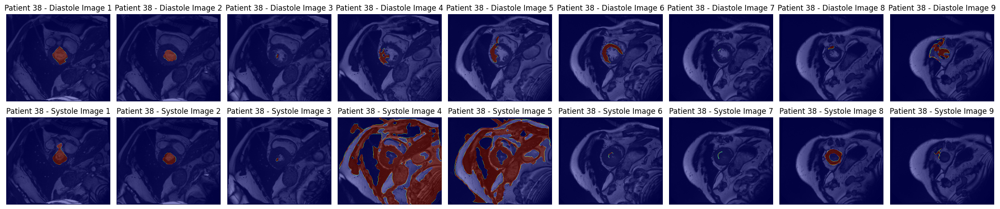

In [121]:
print(f"Le patient {pat_jacc_list_sys[0][0]} possède un jaccard de {pat_jacc_list_sys[0][1]}%")
display_patient_images(pat_jacc_list_sys[0][0])

Le patient 27 possède un jaccard de 5.67%


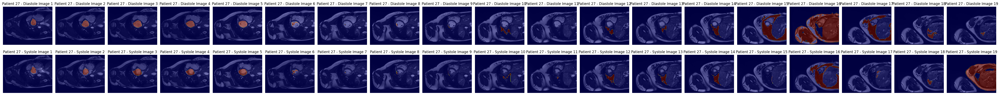

In [122]:
print(f"Le patient {pat_jacc_list_sys[1][0]} possède un jaccard de {pat_jacc_list_sys[1][1]}%")
display_patient_images(pat_jacc_list_sys[1][0])

#### <span style='color:orange'><b>3.3.2. Visualisation des 2 meilleurs cas de systole :

Le patient 32 possède un jaccard de 83.34


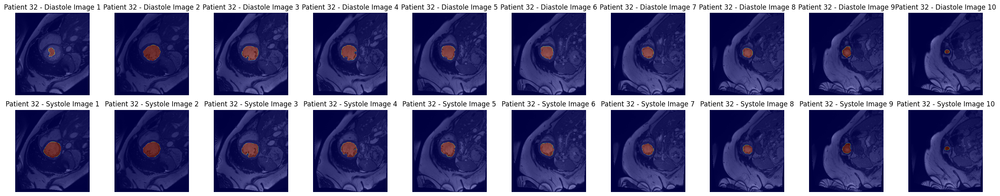

In [123]:
print(f"Le patient {pat_jacc_list_sys[-1][0]} possède un jaccard de {pat_jacc_list_sys[-1][1]}")
display_patient_images(pat_jacc_list_sys[-1][0])

Le patient 13 possède un jaccard de 81.04


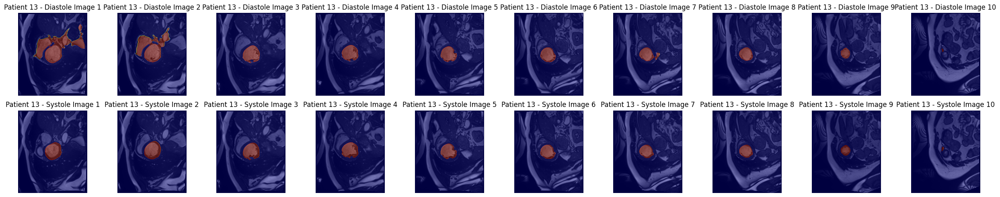

In [124]:
print(f"Le patient {pat_jacc_list_sys[-2][0]} possède un jaccard de {pat_jacc_list_sys[-2][1]}")
display_patient_images(pat_jacc_list_sys[-2][0])

#### <span style='color:orange'><b>3.3.3. Visualisation des superpositions masque de vérité terrain - masque de prédiction :

In [125]:
# Fonction pour visualiser les masques de vérité terrain (vert), et ceux de la propagation superposés (rouge) à l'image originale
def display_patient_images_two_rows(pat, all_masks=all_masks_d, frm=0):
    
    # Obtenir le nombre d'images pour le patient
    num_images = len(all_masks[pat])
    
    # Diviser le nombre d'images en deux lignes
    num_rows = 2
    num_cols = num_images // 2 + (num_images % 2)  # Ajouter une colonne supplémentaire si impair
    
    # Créer une figure avec sous-figures
    fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(3 * num_cols, 4.5 * num_rows))
    axes = np.array(axes)  # S'assurer que les axes sont manipulables comme un tableau 2D
    
    # Aplatir si seulement une ligne
    if num_rows == 1:
        axes = axes[np.newaxis, :] 
    
    # Itérer sur chaque image et remplir les axes
    for i in range(num_images):
        row = i // num_cols
        col = i % num_cols
        ax = axes[row, col]
        
        # Image de base
        base_image = all_patients_data_test[pat][frm, :, :, i]
        plt.imsave('last.jpg', base_image)
        base_image = cv2.imread('last.jpg', cv2.IMREAD_GRAYSCALE)
        
        # Masques
        mask_d = all_masks[pat][i]
        mask_g = extract_gt_mask_test(pat)[:, :, i]
        
        # Superposer les masques avec des couleurs spécifiques en utilisant `imshow`
        overlay_real1 = label2rgb(mask_d, image=base_image, bg_label=0, alpha=0.5, colors=['red'])
        overlay_real2 = label2rgb(mask_g, image=base_image, bg_label=0, alpha=0.5, colors=['green'])

        # Afficher l'image combinée
        ax.imshow((overlay_real1 + overlay_real2) / 2)
        ax.set_title(f"Coupe {i + 1}")
        ax.axis('off')
    
    # Désactiver les axes inutilisés si num_images est impair
    for j in range(num_images, num_rows * num_cols):
        row = j // num_cols
        col = j % num_cols
        fig.delaxes(axes[row, col])  # Supprimer les axes inutilisés
    
    # Ajouter le titre principal
    if frm == 0:
        plt.suptitle(f'Diastole et Vérité terrain pour le patient {pat}', fontsize=16)
    else:
        plt.suptitle(f'Systole et Vérité terrain pour le patient {pat}', fontsize=16)
    
    plt.tight_layout()
    plt.show()


(16, 0.58)


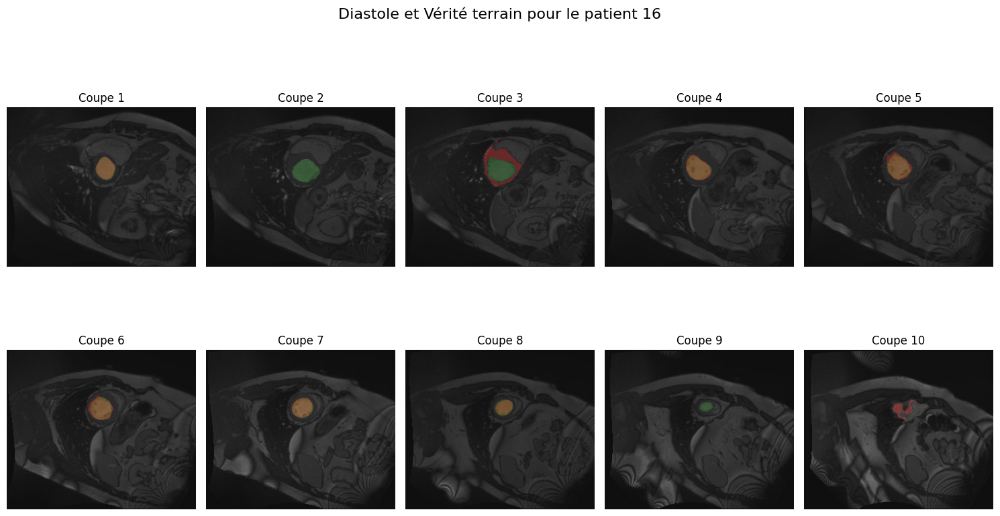

In [126]:
print(pat_jacc_list[0])
display_patient_images_two_rows(16)

(38, 1.87)


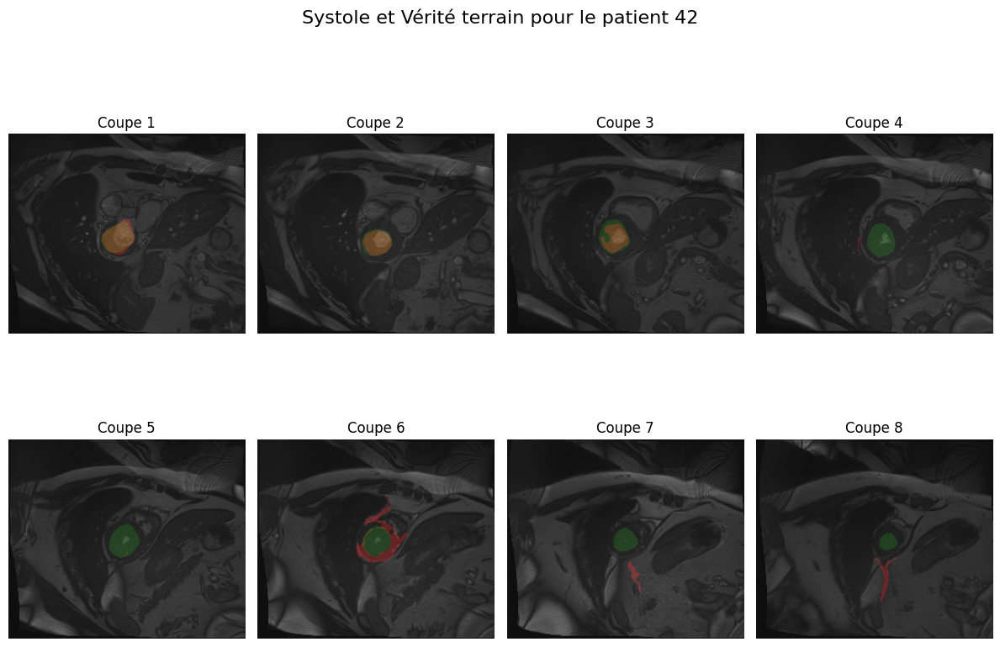

In [127]:
print(pat_jacc_list_sys[0])
display_patient_images_two_rows(42, all_masks_s_blind, all_patients_systole_number[42])

(9, 95.5)


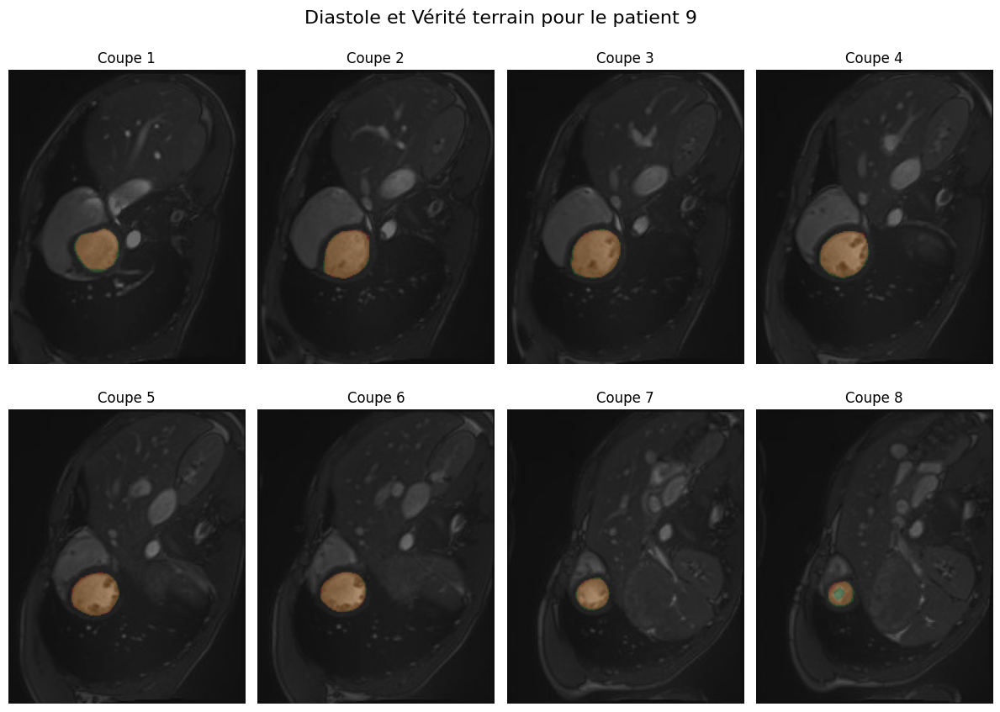

In [128]:
print(pat_jacc_list[-3])
display_patient_images_two_rows(9)

(32, 83.34)


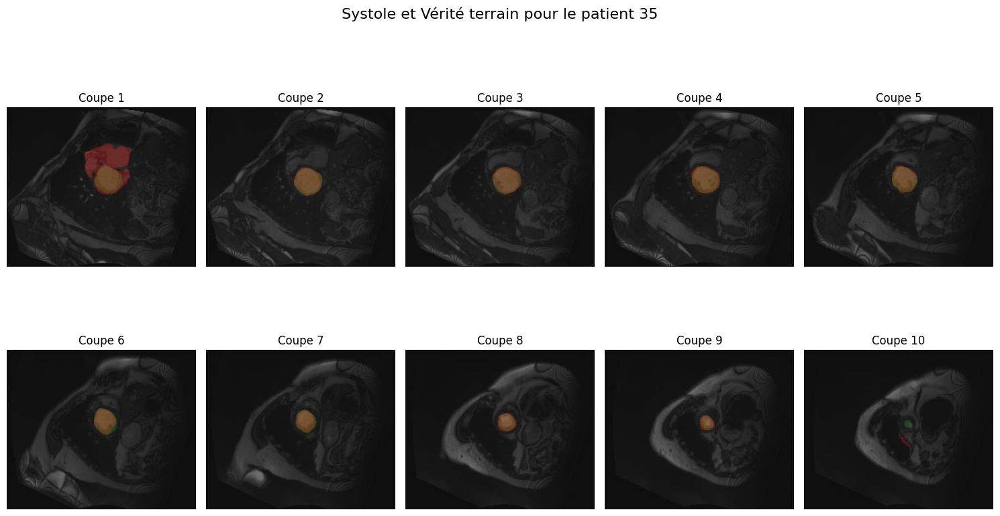

In [129]:
print(pat_jacc_list_sys[-1])
display_patient_images_two_rows(35, all_masks_s_blind, all_patients_systole_number[35])

### <span style='color:blue'><b>3.4. Propagation totales des centres et résultats finaux (qualitatifs) :

Maintenant, nous allons finaliser le projet avec **la visualisation de tous les masques de prédiction (temporels et spatiaux)**. 

Pour ce faire : 
* Nous calculons tout d'abord les masques de prédictions au moment de la diastole. 
* Puis, pour chaque instant dans le temps, on prend les barycentres des masques de prédictions de l'instant précédent, et on le propage. 

In [130]:
def display_all_frames_and_slices(patient, all_patients_data_test):
    
    num_frames, _, _, num_slices = all_patients_data_test[patient].shape
    
    # Crée une grille de subplots avec une ligne pour chaque coupe (slice) et une colonne pour chaque frame
    _, axes = plt.subplots(nrows=num_slices, ncols=num_frames, figsize=(2 * num_frames, 2 * num_slices))

    # Itérer sur chaque coupe et chaque frame
    for f in range(num_frames):
        if f == 0 : 
            for s in range(num_slices):
                ax = axes[s, f]
                # Image de base
                base_image = all_patients_data_test[patient][f, :, :, s]
                # Masque correspondant
                mask = all_masks_d[patient][s]
                # Affiche l'image de base
                ax.imshow(base_image, cmap='gray')
                # Superpose le masque (si disponible)
                if mask is not None:
                    ax.imshow(mask, cmap='jet', alpha=0.5)
                # Ajuste les titres et axes
                ax.set_title(f"Frame {f+1}, Slice {s+1}")
                ax.axis('off')
                all_masks_1 = all_masks_d
        else : 
            _, all_masks_loc = propagate_seeds_and_masks_Flood_test_prop_sys_blind(
                vr=region_vr, 
                median_r=region_med, 
                morpho=region_morpho, 
                init_tol=region_it, 
                eq=region_eq, 
                frame=f, 
                best_slice=best_slice, 
                all_patients=[patient],
                all_masks_d=all_masks_1
            )
            all_masks_1 = all_masks_loc
            for s in range(num_slices):
                ax = axes[s, f]
                # Image de base
                base_image = all_patients_data_test[patient][f, :, :, s]
                # Masque correspondant
                mask = all_masks_loc[patient][s]
                # Affiche l'image de base
                ax.imshow(base_image, cmap='gray')
                # Superpose le masque (si disponible)
                if mask is not None:
                    ax.imshow(mask, cmap='jet', alpha=0.5)
                # Ajuste les titres et axes
                ax.set_title(f"Frame {f+1}, Slice {s+1}")
                ax.axis('off')

    plt.tight_layout()
    plt.show()


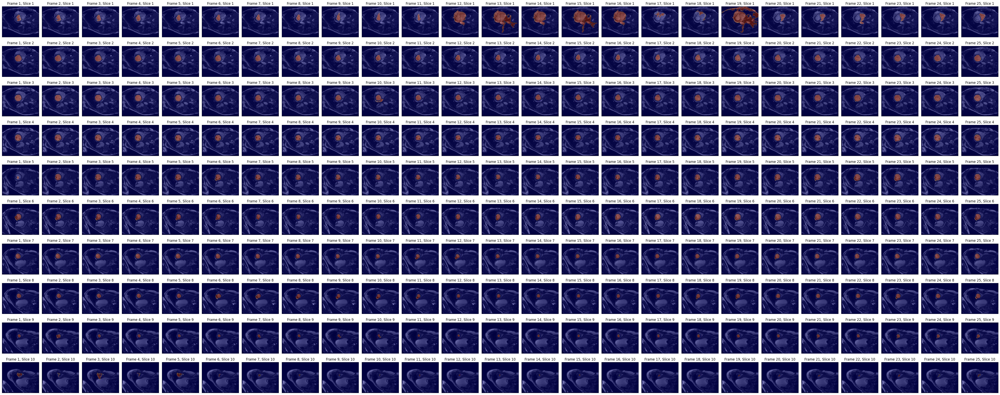

In [ ]:
# Génération des masques pour un patient donné
patient = 49  # ID du patient

# Visualisation de toutes les coupes et frames
display_all_frames_and_slices(
    patient=patient, 
    all_patients_data_test=all_patients_data_test
)
